In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from AT_plots import create_polar_plot

/its/home/nn268/.local/lib/python3.10/site-packages/pandas/core/arrays/masked.py:62: UserWarning: Pandas requires version '1.3.4' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (
/its/home/nn268/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
#sns.set_style('darkgrid')
sns.set_context('paper')#,rc={'figure.figsize':(6,3)})
plt.rcParams['figure.figsize'] = (6,6) #width, height
plt.rcParams['figure.titlesize'] = 20
plt.rcParams['font.size'] = 15

# sns.set_theme()
sns.set(font_scale=3)

In [3]:
Trim_all = pd.read_csv("RealAnts_ALL_TRIM.csv")
TrimNG_all = pd.read_csv("RealAnts_ALL_TRIMNG.csv")

/tmp/ipykernel_121840/3176302761.py:1: DtypeWarning: Columns (4,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  Trim_all = pd.read_csv("RealAnts_ALL_TRIM.csv")
/tmp/ipykernel_121840/3176302761.py:2: DtypeWarning: Columns (4,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  TrimNG_all = pd.read_csv("RealAnts_ALL_TRIMNG.csv")


In [4]:
# Wigwam 

wig_onR1 = "Wigwam_On-route 1 ZV.csv"
wig_offR1 = "Wigwam_Off-route 1 ZV.csv"
wig_onR2 = "Wigwam_On-route 2 ZV.csv"
wig_unfZV ="Wigwam_Unfamiliar ZV.csv"
wig_unfFV = "Wigwam_Unfamiliar FV.csv"

wig_onR1_df = pd.read_csv(wig_onR1)
wig_offR1_df = pd.read_csv(wig_offR1)
wig_onR2_df = pd.read_csv(wig_onR2)
wig_unfZV_df = pd.read_csv(wig_unfZV)
wig_unfFV_df = pd.read_csv(wig_unfFV)

# NewNest
newN_onR1ZV = "NewNest_On-route 1 ZV.csv"
newN_offR1ZV = "NewNest_Off-route 1 ZV.csv"
newN_onR1bZV = "NewNest_On-route 1B ZV.csv"
newN_onR2ZV = "NewNest_On-route 2 ZV.csv"
newN_unfZV = "NewNest_Unfamiliar ZV.csv"
newN_unfFV = "NewNest_Unfamiliar FV.csv"
newN_unfZV2 = "NewNest_Unfamiliar ZV 2.csv"
newN_unfZV3 = "NewNest_Unfamiliar ZV 3.csv"
newN_OR0 = "NewNest_Route 0m ZV.csv"
newN_OR3m = "NewNest_Plus 3m ZV.csv"

newN_onR1ZV_df = pd.read_csv(newN_onR1ZV)
newN_offR1ZV_df = pd.read_csv(newN_offR1ZV)
newN_onR1bZV_df = pd.read_csv(newN_onR1bZV)

newN_onR2ZV_df = pd.read_csv(newN_onR2ZV)

newN_unfZV_df = pd.read_csv(newN_unfZV)
newN_unfFV_df = pd.read_csv(newN_unfFV)
newN_unfZV2_df = pd.read_csv(newN_unfZV2)
newN_unfZV3_df = pd.read_csv(newN_unfZV3)

newN_OR0_df = pd.read_csv(newN_OR0)
newN_OR3m_df = pd.read_csv(newN_OR3m)


In [134]:
wig_all = pd.concat([wig_onR1_df, wig_offR1_df, wig_onR2_df, wig_unfZV_df, wig_unfFV_df], ignore_index=True)
NewN_all = pd.concat([newN_onR1ZV_df, newN_offR1ZV_df, newN_onR2ZV_df, newN_unfZV_df, newN_unfFV_df], ignore_index=True)

NewN_ONR = pd.concat([newN_onR1ZV_df, newN_onR1bZV_df, newN_OR0_df, newN_OR3m_df], ignore_index=True) #newN_offR1ZV_df

WigNew_ONR = pd.concat([wig_onR1_df, newN_onR1ZV_df, newN_onR1bZV_df, newN_OR0_df, newN_OR3m_df], ignore_index=True)

both_ONR = pd.concat([NewN_ONR, WigNew_ONR])

NewN_ONROFR = pd.concat([newN_onR1ZV_df, newN_offR1ZV_df, newN_onR1bZV_df, newN_OR0_df, newN_OR3m_df], ignore_index=True)

both_all = pd.concat([wig_all, NewN_all], ignore_index=True)

distant_only = pd.concat([wig_unfZV_df, wig_unfFV_df, newN_unfZV_df, newN_unfFV_df, newN_unfZV2_df, newN_unfZV3_df],  ignore_index=True)

In [6]:
print(list(both_all))
both_all = both_all.drop(columns=['Unnamed: 0'])
both_all = both_all.replace('Wigwam', 'Nest1')
both_all = both_all.replace('NewNest', 'Nest2')

# ['Unfamiliar ZV', 'Unfamiliar FV', 'Unfamiliar ZV 2', 'Unfamiliar ZV 3']
both_all = both_all.replace('Unfamiliar ZV', 'Distant ZV')
both_all = both_all.replace('Unfamiliar FV', 'Distant FV')
both_all = both_all.replace('Unfamiliar ZV 2', 'Distant ZV 2')
both_all = both_all.replace('Unfamiliar ZV 3', 'Distant ZV 3')

both_all.head()

distant_only = distant_only.replace('Unfamiliar ZV', 'Distant ZV')
distant_only = distant_only.replace('Unfamiliar FV', 'Distant FV')
distant_only = distant_only.replace('Unfamiliar ZV 2', 'Distant ZV 2')
distant_only = distant_only.replace('Unfamiliar ZV 3', 'Distant ZV 3')

['Unnamed: 0', 'Nest', 'Condition', 'Ant ID', 'TrimStraightnessIndex', 'TrimNoGaps_CircR', 'TrimChunksCircR', 'TrimSpeedPerFrameNoGapsMean', 'TrimFinalPointRelToNest', 'TrimLengthTotalmm', 'TrimBeelinePath (mm)']


In [128]:
print(np.unique(both_all['Condition']))
print("")
print(np.unique(wig_all['Condition']))
print("")
print(np.unique(NewN_all['Condition']))

['Distant FV' 'Distant ZV' 'Off-route 1 ZV' 'On-route 1 ZV'
 'On-route 2 ZV']

['Off-route 1 ZV' 'On-route 1 ZV' 'On-route 2 ZV' 'Unfamiliar FV'
 'Unfamiliar ZV']

['Off-route 1 ZV' 'On-route 1 ZV' 'On-route 2 ZV' 'Unfamiliar FV'
 'Unfamiliar ZV']


# Box

'for ax in g.axes_dict.values():\n    g.tick_params(axis=\'x\', rotation=90) #, size=25\n    ax.axline((0, 11), slope=0, c="0.4", ls="--", zorder=0)\n    ax.tick_params(axis=\'both\', which=\'major\') #, labelsize=26\n\n    g.set_axis_labels("", "Test Accuracy (%)") #, fontsize=25'

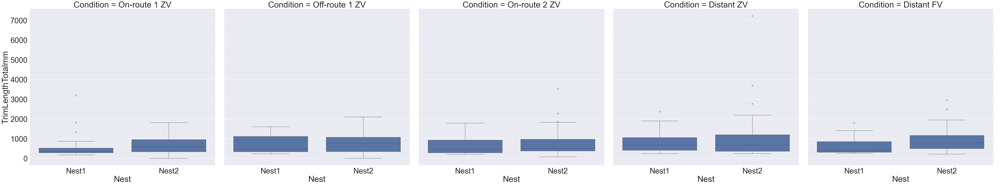

In [7]:
g = sns.catplot(
    data= both_all, kind= "box",
    x="Nest",  y="TrimLengthTotalmm", col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()
"""def add_stripplot(x, y, **kwargs):
    ax = plt.gca()
    data = kwargs.pop("data")
    sns.stripplot(x=x, y=y, data=data, ax=ax, dodge=True, alpha=0.8, linewidth=1)
"""
# Apply the stripplot function to each subplot
#g.map_dataframe(add_stripplot, "model_name", "test_acc")
"""for ax in g.axes_dict.values():
    g.tick_params(axis='x', rotation=90) #, size=25
    ax.axline((0, 11), slope=0, c="0.4", ls="--", zorder=0)
    ax.tick_params(axis='both', which='major') #, labelsize=26

    g.set_axis_labels("", "Test Accuracy (%)") #, fontsize=25"""



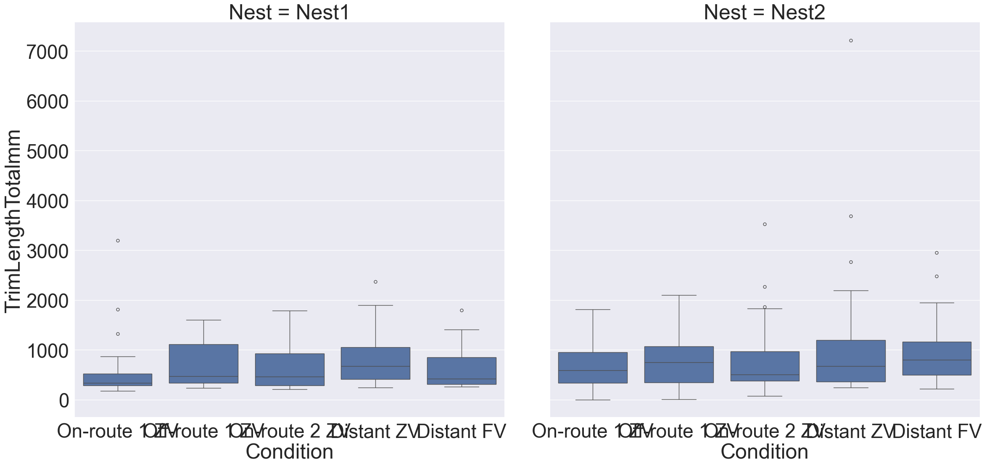

In [8]:
g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimLengthTotalmm", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

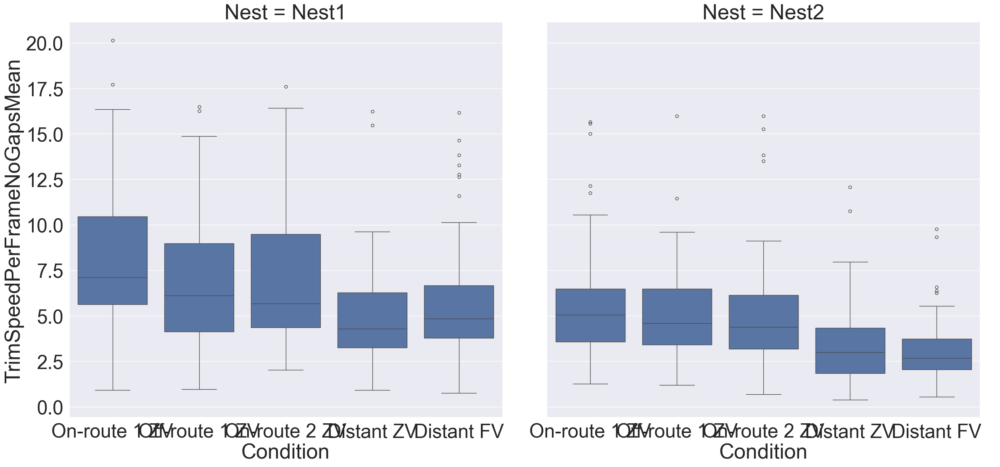

In [9]:
g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimSpeedPerFrameNoGapsMean", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

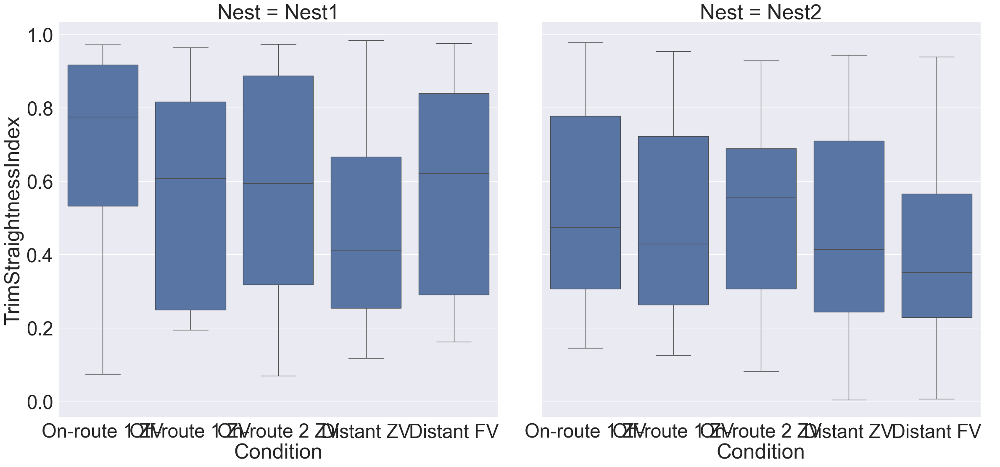

In [10]:
g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimStraightnessIndex", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

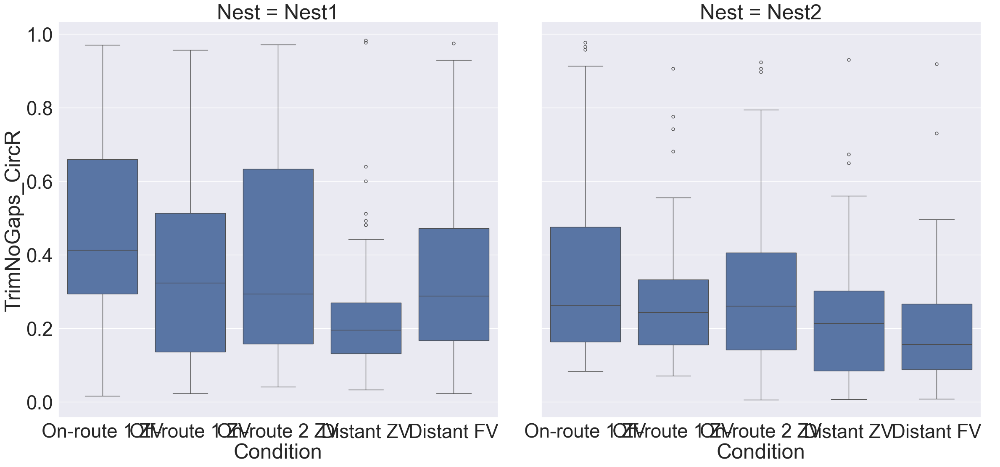

In [11]:
g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimNoGaps_CircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

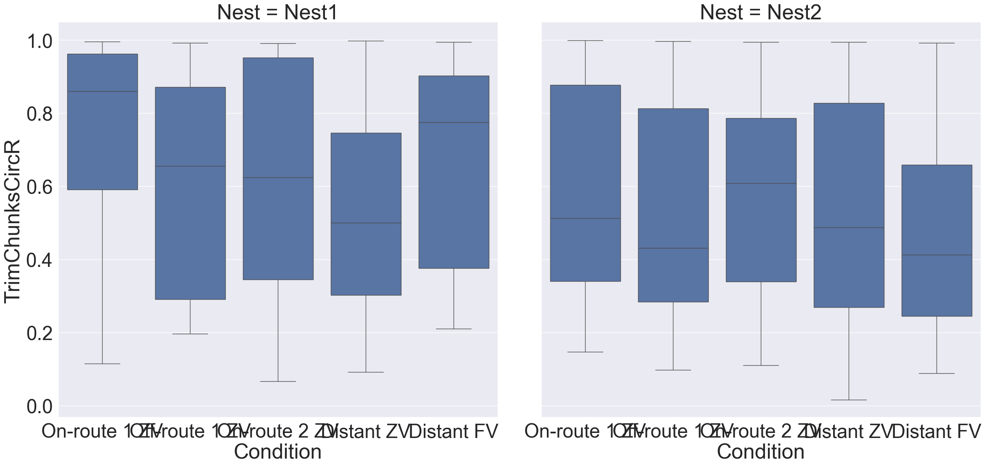

In [12]:

g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimChunksCircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

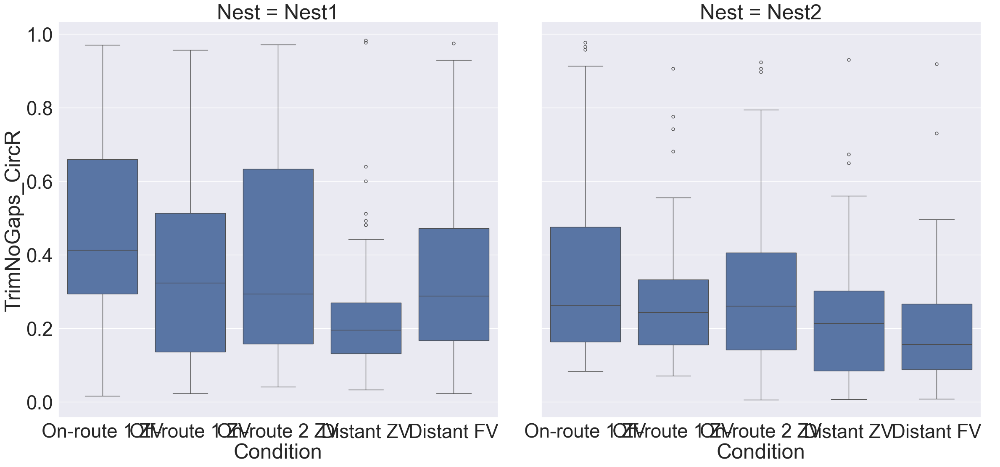

In [13]:

g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimNoGaps_CircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

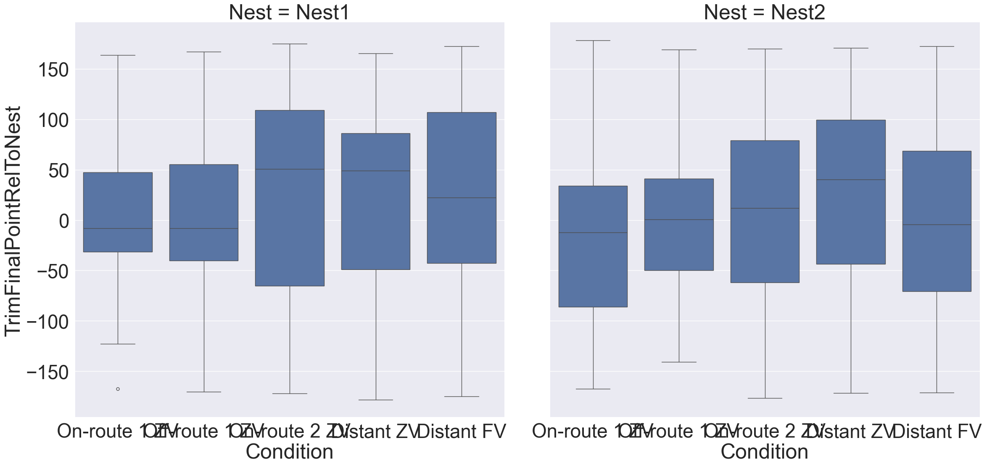

In [14]:

g = sns.catplot(
    data= both_all, kind= "box",
    x="Condition",  y="TrimFinalPointRelToNest", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

## distant only

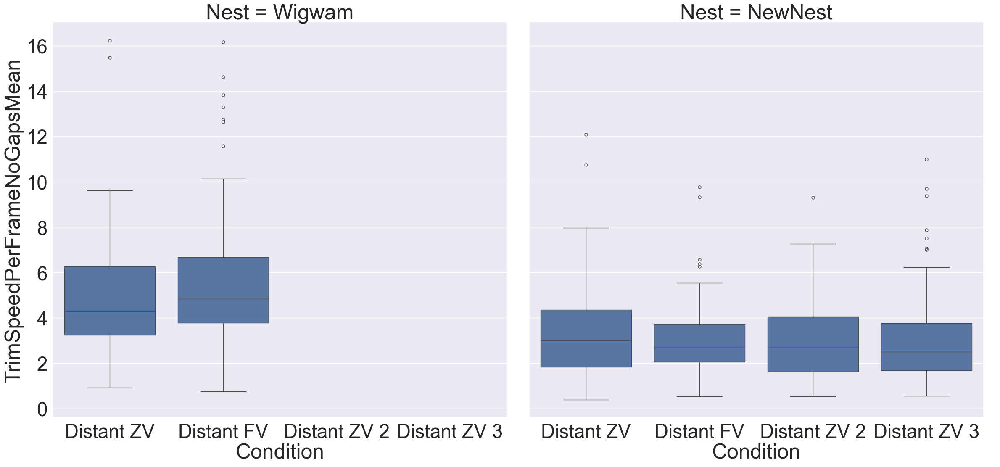

In [15]:
# distant_only
g = sns.catplot(
    data= distant_only, kind= "box",
    x="Condition",  y="TrimSpeedPerFrameNoGapsMean", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

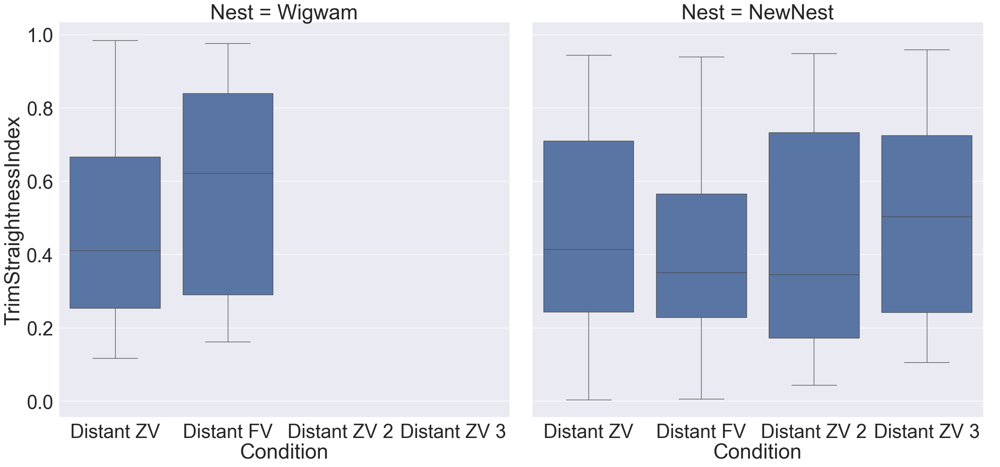

In [16]:
g = sns.catplot(
    data= distant_only, kind= "box",
    x="Condition",  y="TrimStraightnessIndex", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

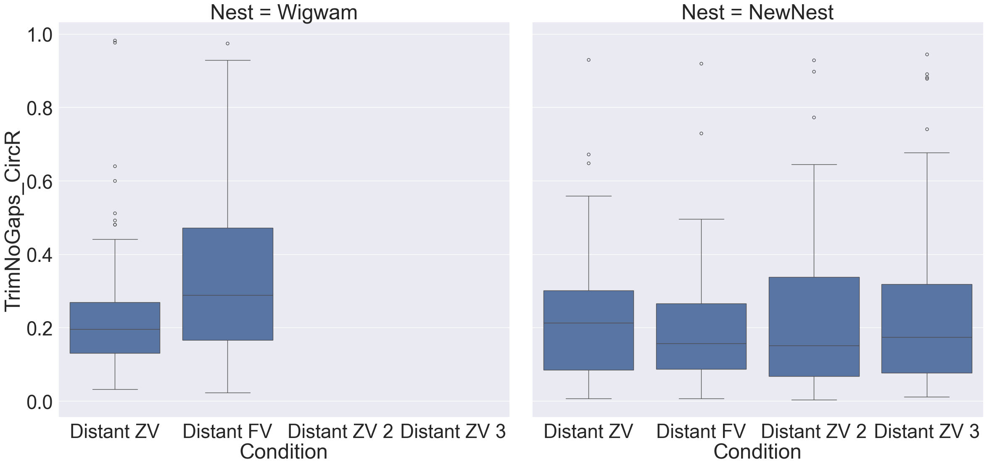

In [17]:
g = sns.catplot(
    data= distant_only, kind= "box",
    x="Condition",  y="TrimNoGaps_CircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

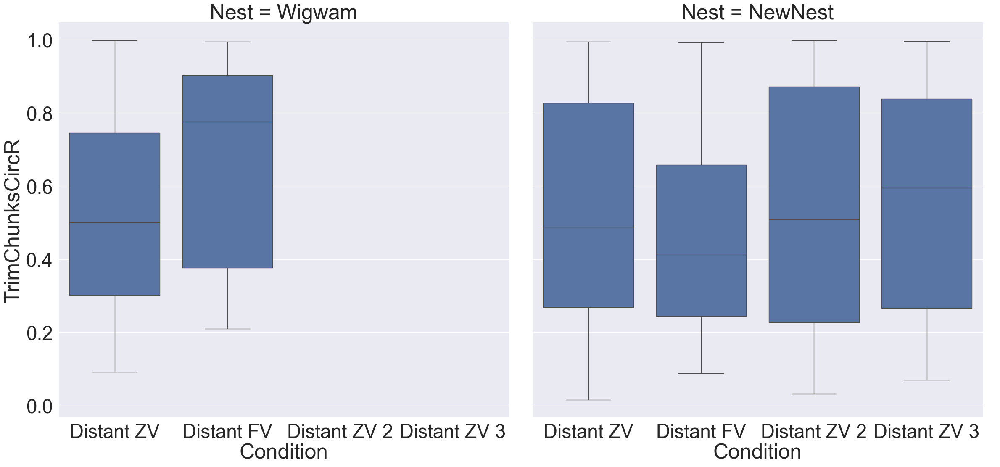

In [18]:

g = sns.catplot(
    data= distant_only, kind= "box",
    x="Condition",  y="TrimChunksCircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

## WigNew_ONR

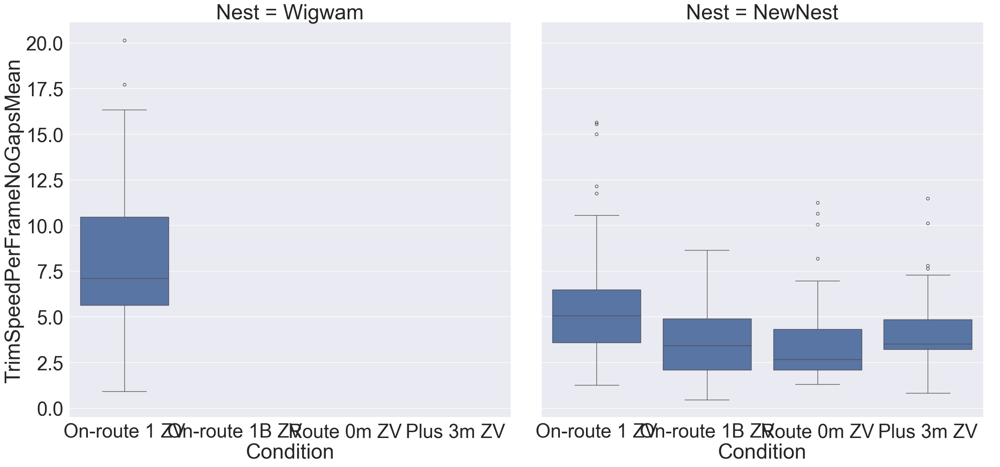

In [19]:
 #WigNew_ONR

g = sns.catplot(
    data= WigNew_ONR, kind= "box",
    x="Condition",  y="TrimSpeedPerFrameNoGapsMean", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

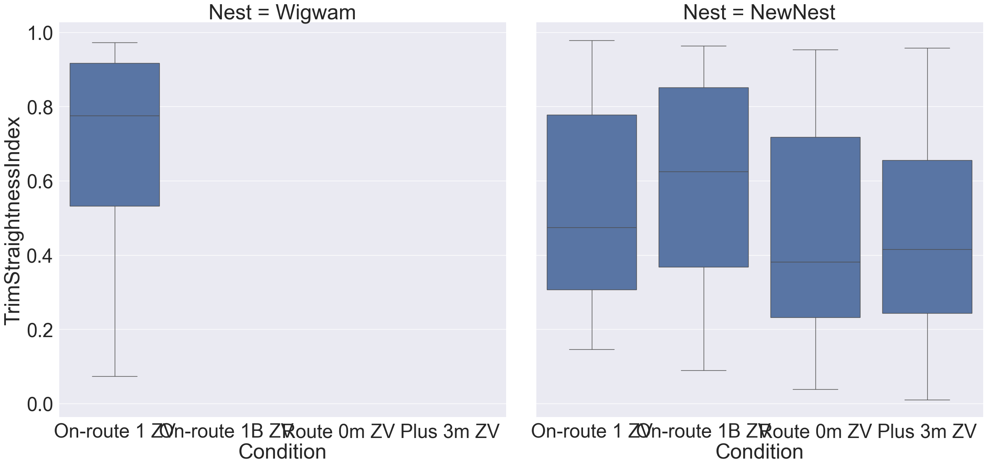

In [20]:
g = sns.catplot(
    data= WigNew_ONR, kind= "box",
    x="Condition",  y="TrimStraightnessIndex", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

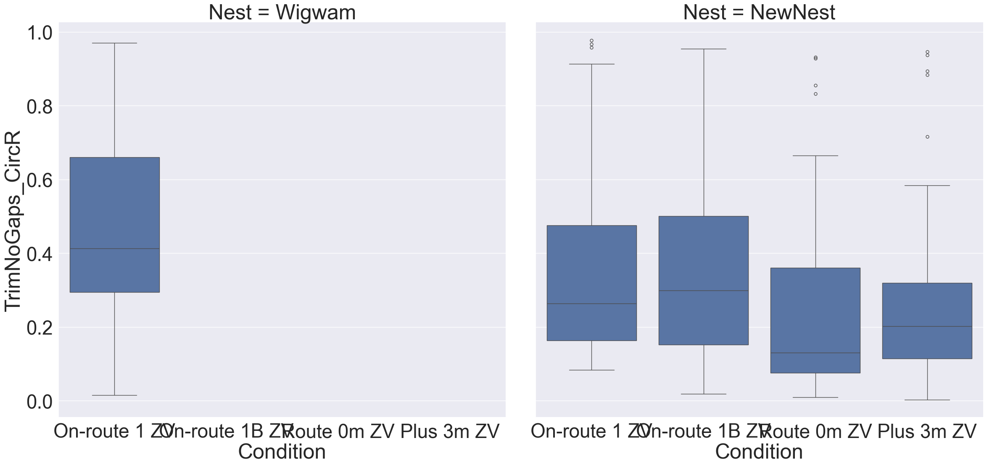

In [21]:
g = sns.catplot(
    data= WigNew_ONR, kind= "box",
    x="Condition",  y="TrimNoGaps_CircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

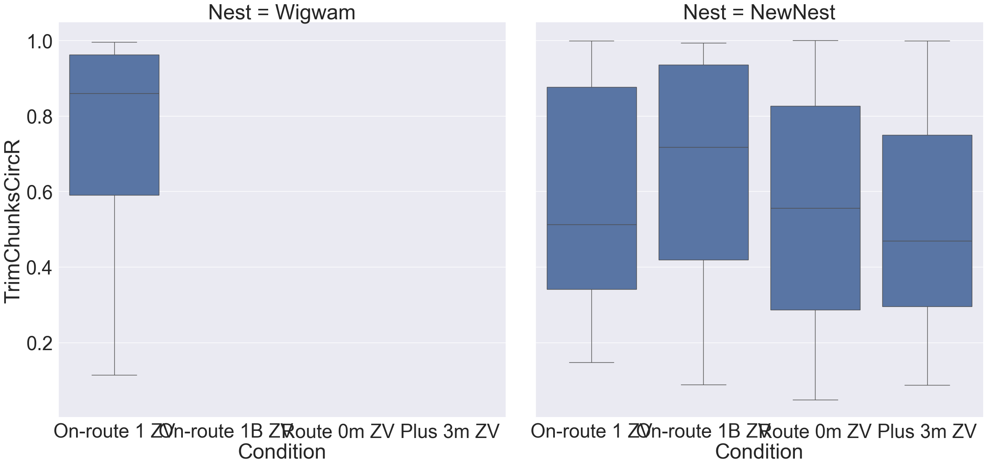

In [22]:

g = sns.catplot(
    data= WigNew_ONR, kind= "box",
    x="Condition",  y="TrimChunksCircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

# Violin

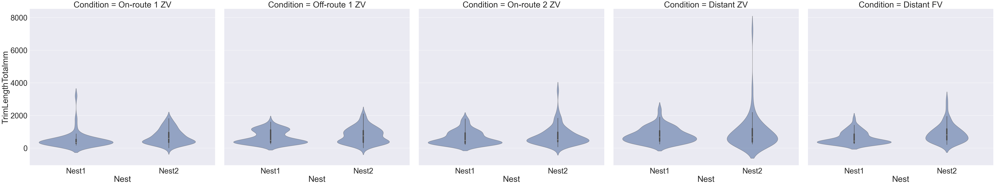

In [23]:
g = sns.catplot(
    data= both_all, kind= "violin",
    x="Nest",  y="TrimLengthTotalmm", col = 'Condition', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )

plt.tight_layout()

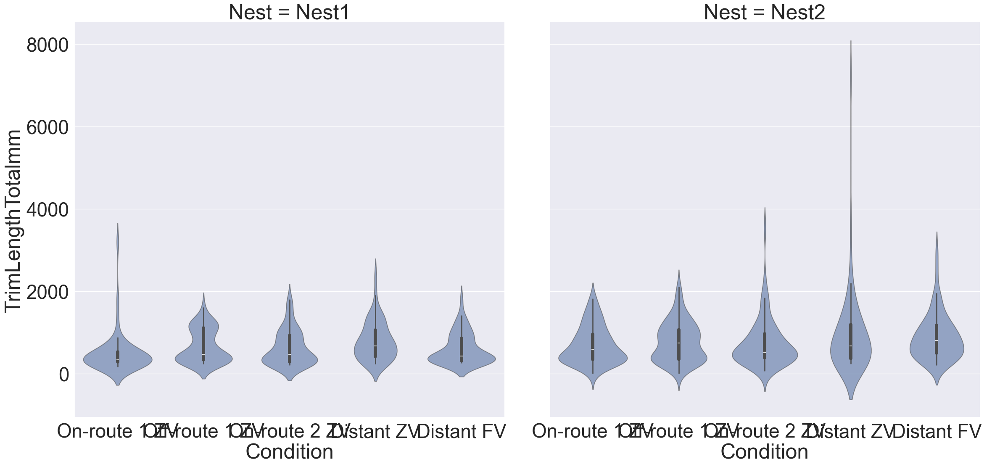

In [24]:
g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimLengthTotalmm", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

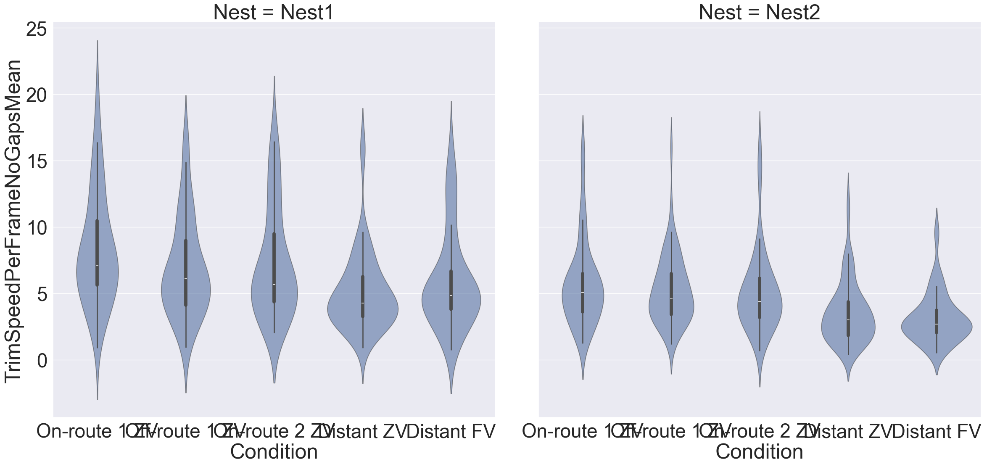

In [25]:
g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimSpeedPerFrameNoGapsMean", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

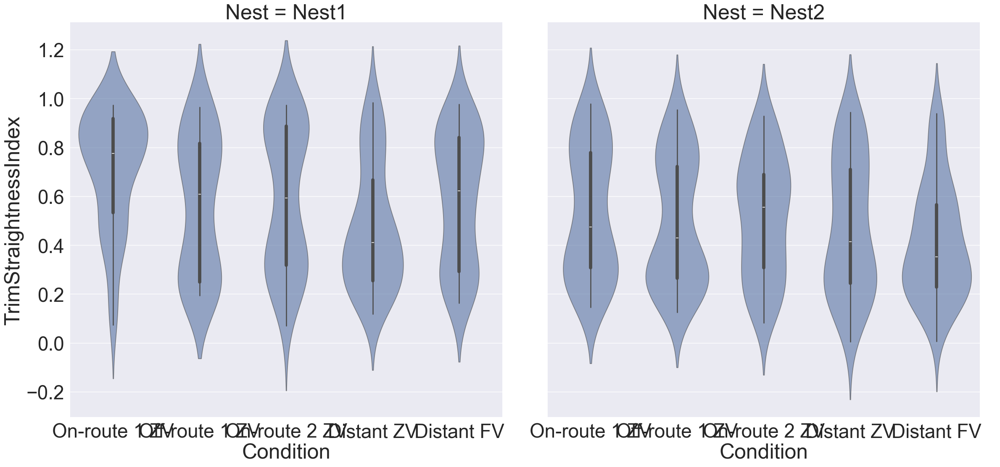

In [26]:
g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimStraightnessIndex", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

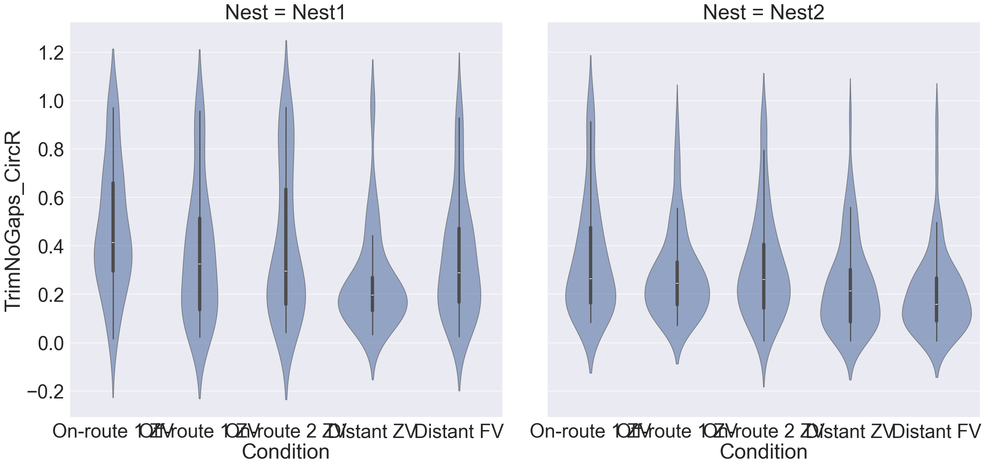

In [27]:
g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimNoGaps_CircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

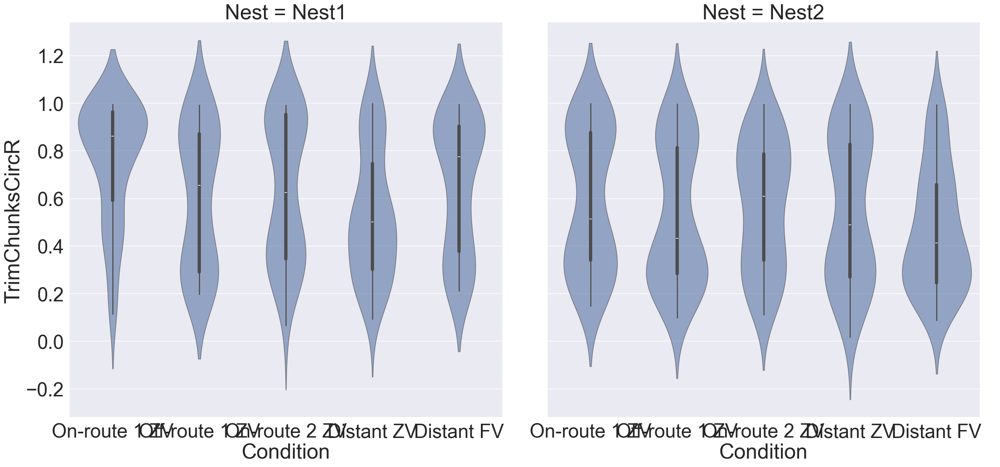

In [28]:

g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimChunksCircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

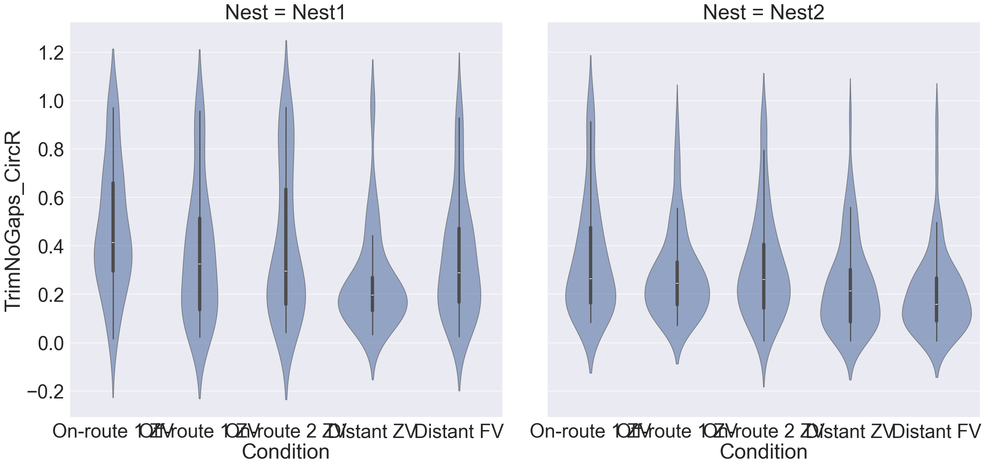

In [29]:

g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimNoGaps_CircR", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

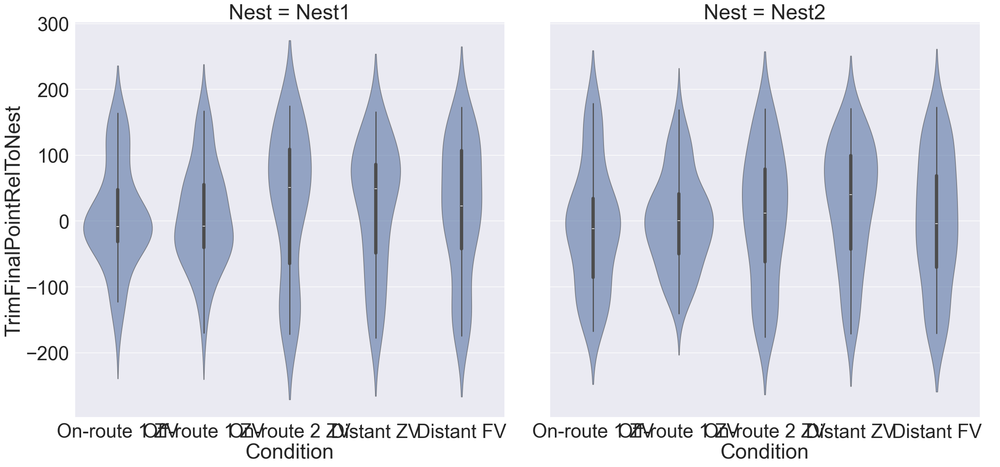

In [30]:

g = sns.catplot(
    data= both_all, kind= "violin",
    x="Condition",  y="TrimFinalPointRelToNest", col = 'Nest', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

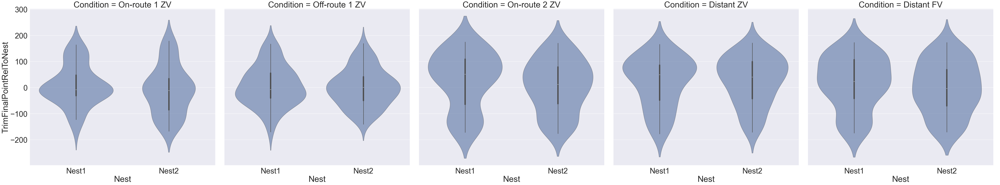

In [31]:

g = sns.catplot(
    data= both_all, kind= "violin",
    x="Nest",  y="TrimFinalPointRelToNest", col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )# palette="colorblind",
#) #, legend=True
plt.tight_layout()

# half & half

In [32]:
list(both_all)

['Nest',
 'Condition',
 'Ant ID',
 'TrimStraightnessIndex',
 'TrimNoGaps_CircR',
 'TrimChunksCircR',
 'TrimSpeedPerFrameNoGapsMean',
 'TrimFinalPointRelToNest',
 'TrimLengthTotalmm',
 'TrimBeelinePath (mm)']

## working out

g = sns.catplot(
    data= both_all, kind= "violin",
    x="Nest",  y="TrimLengthTotalmm", col = 'Condition', 
    errorbar="sd", alpha=.6, height=12, margin_titles=True )

plt.tight_layout()

In [33]:
palette = sns.cubehelix_palette(start=.5, rot=.5, dark=0.3, light=0.7)

import matplotlib.ticker as ticker

/tmp/ipykernel_121840/1414803805.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(y="TrimLengthTotalmm", x='Nest', data=both_all, palette=palette, scale='width', inner=None, split=True)
/tmp/ipykernel_121840/1414803805.py:1: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y="TrimLengthTotalmm", x='Nest', data=both_all, palette=palette, scale='width', inner=None, split=True)
/tmp/ipykernel_121840/1414803805.py:1: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y="TrimLengthTotalmm", x='Nest', data=both_all, palette=palette, scale='width', inner=None, split=True)


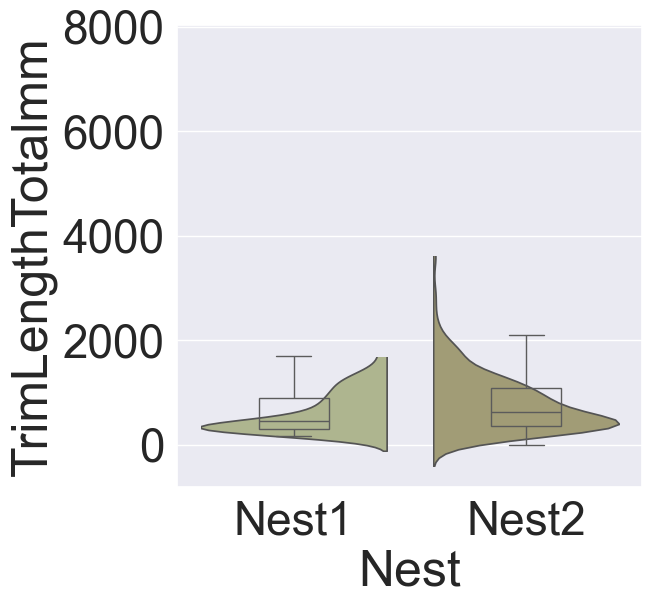

In [34]:
ax = sns.violinplot(y="TrimLengthTotalmm", x='Nest', data=both_all, palette=palette, scale='width', inner=None, split=True)


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height /2, transform=ax.transData))

sns.boxplot(y='TrimLengthTotalmm', x ='Nest', data=both_all, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax)
old_len_collections = len(ax.collections)
#sns.stripplot(y='TrimLengthTotalmm', x='Nest', data=both_all, color ='dodgerblue', ax=ax)

#for dots in ax.collections[old_len_collections:]:
#    dots.set_offsets(dots.get_offsets() + np.array([0, 0.12]))

ax.set_xlim(xlim)
ax.set_ylim(ylim)

plt.show()

/tmp/ipykernel_121840/3972009849.py:7: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/3972009849.py:7: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


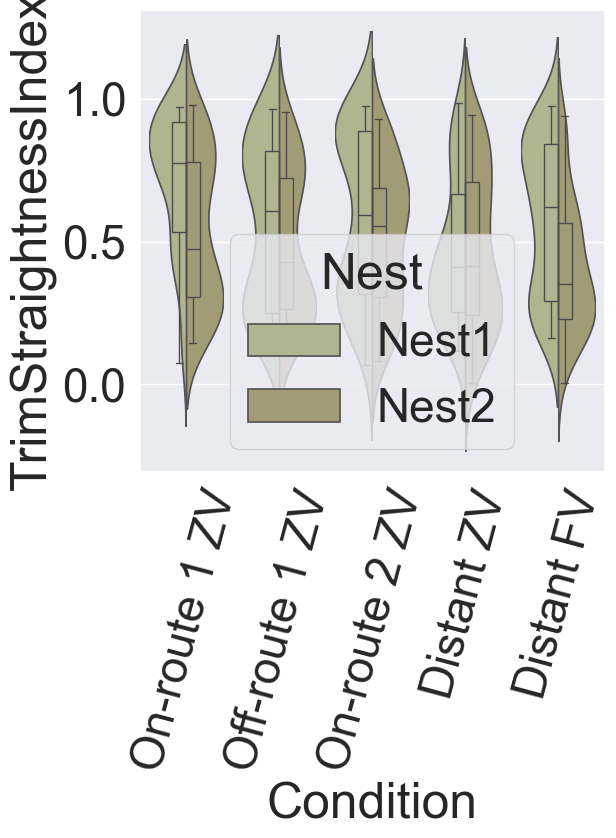

In [35]:
x_var = 'Condition'
y_var = 'TrimStraightnessIndex'
df = both_all



ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

plt.show()

## distance travelled

/tmp/ipykernel_121840/4194723264.py:11: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest', ax=ax1)
/tmp/ipykernel_121840/4194723264.py:11: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest', ax=ax1)
/tmp/ipykernel_121840/4194723264.py:14: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest', ax=ax2, legend=False)
/tmp/ipykernel_121840/4194723264.py:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sn

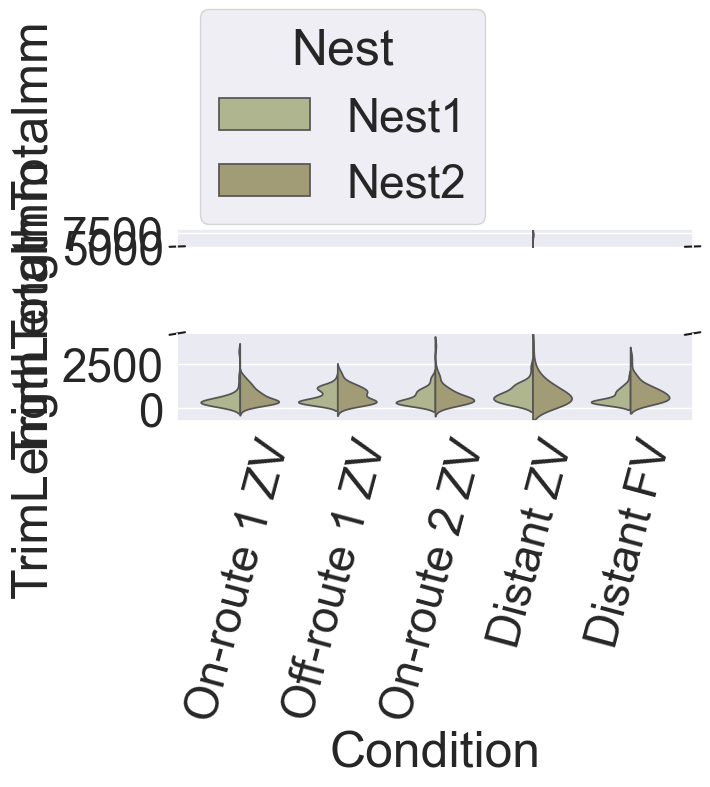

In [36]:
# TrimLengthTotalmm



x_var = 'Condition'
y_var = 'TrimLengthTotalmm'
df = both_all

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(8, 8), gridspec_kw={'height_ratios': [1, 5]})

sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest', ax=ax1)
ax1.set_ylim(5000, df[y_var].max()+1000)

sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest', ax=ax2, legend=False)
ax2.set_ylim(-700, 4200)

ax1.spines.bottom.set_visible(False)
ax2.spines.top.set_visible(False)
ax1.tick_params(labelbottom=False)

d = .015  # size of diagonal marks
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((-d, +d), (-d, +d), **kwargs)
ax1.plot((1 - d, 1 + d), (-d, +d), **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)

ax2.tick_params(axis='x', rotation=75)

plt.tight_layout()

plt.show()

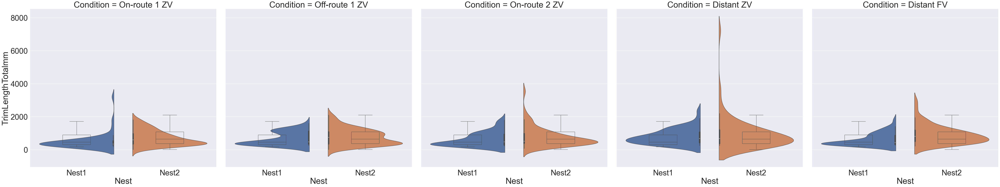

In [37]:
x_var = 'Nest'
y_var = 'TrimLengthTotalmm'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue='Nest', legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():
    

plt.tight_layout()
plt.show()

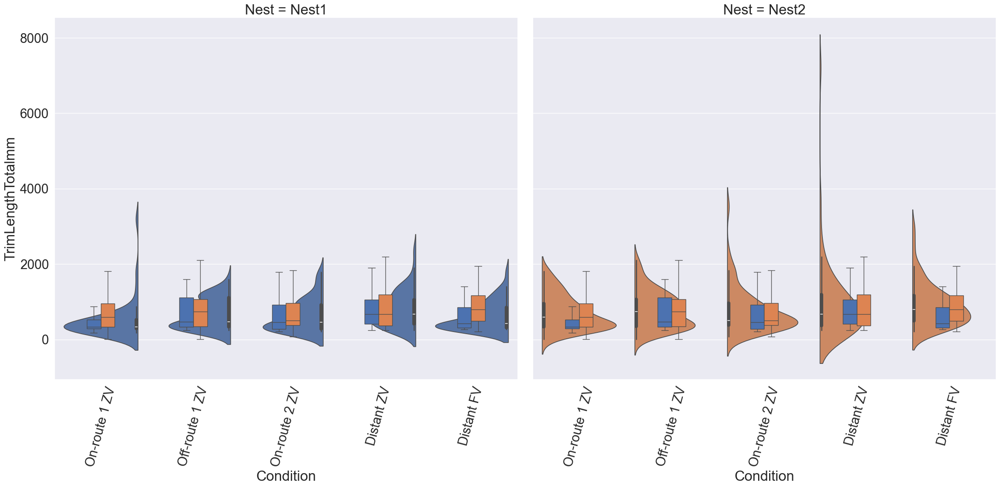

In [38]:
x_var = 'Condition'
y_var = 'TrimLengthTotalmm'
colsplit = 'Nest'

sns.set(font_scale=2)

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit, #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit, legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    #ax.tick_params(axis='x', rotation=75)
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)
    #ax.tick_params(axis='x', rotation=75)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():

# , boxprops={'zorder':3, 'facecolor':'none'}
g.tick_params(axis='x', rotation=75)
plt.tight_layout()
plt.show()

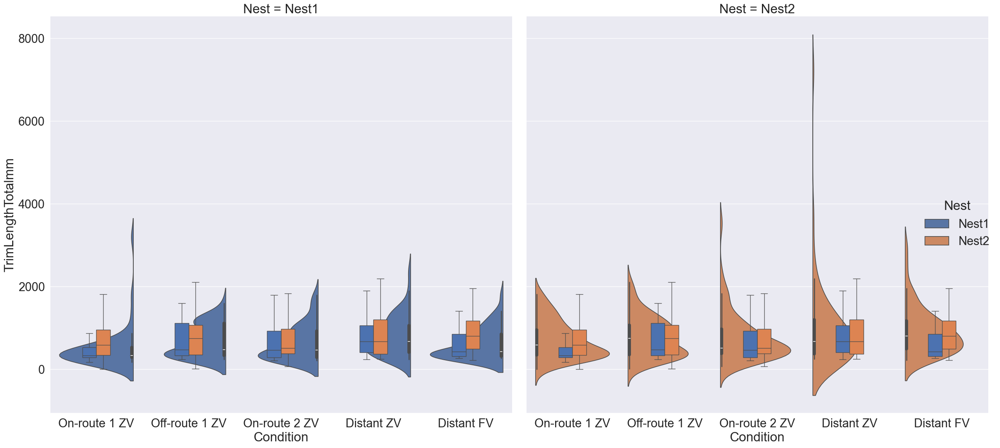

In [39]:
x_var = 'Condition'
y_var = 'TrimLengthTotalmm'
colsplit = 'Nest'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit, #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)
   # ax.set_yscale('log')
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():

# , boxprops={'zorder':3, 'facecolor':'none'}

plt.tight_layout()
plt.show()

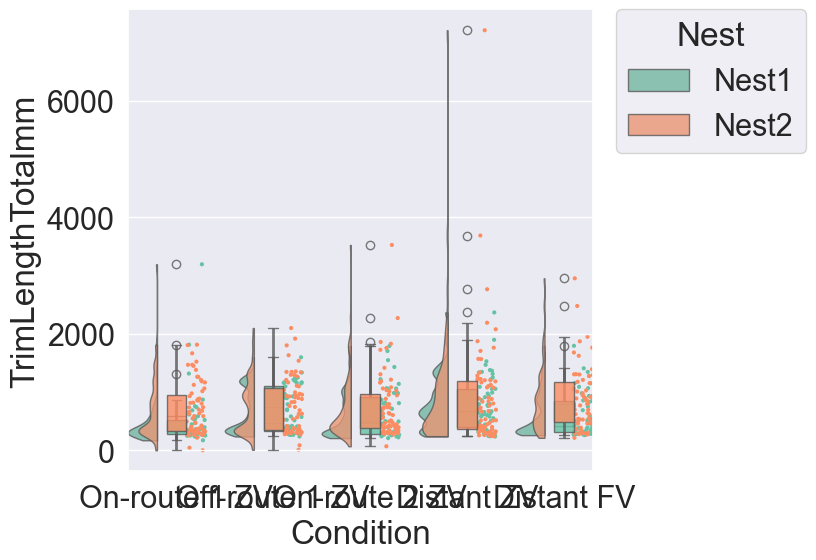

In [40]:
import ptitprince as pt

x_var = 'Condition'
y_var = 'TrimLengthTotalmm'
hue_var = 'Nest'
colsplit = 'Nest'


ax = pt.RainCloud(
    x= x_var, y=y_var, hue = hue_var, data = both_all, palette = "Set2",
    width_viol=0.6, width_box = 0.2,
    move = 0.2, orient="v", alpha= 0.8 )

plt.show()

## mean speed

/tmp/ipykernel_121840/1374130516.py:13: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/1374130516.py:13: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


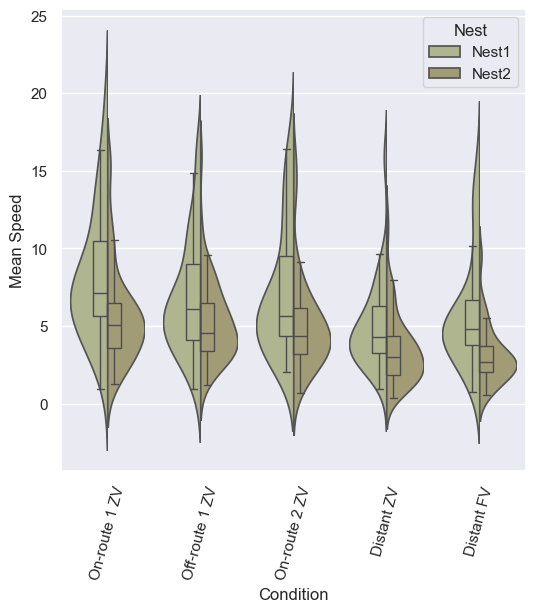

In [41]:
# TrimLengthTotalmm



x_var = 'Condition'
y_var = 'TrimSpeedPerFrameNoGapsMean'

df = both_all


sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_xlabel('Condition')
ax.set_ylabel('Mean Speed')

plt.show()
plt.show()

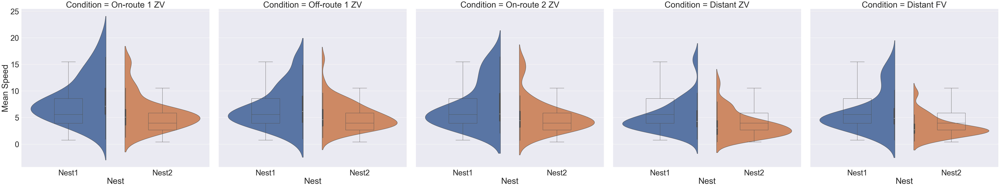

In [42]:
x_var = 'Nest'

sns.set(font_scale=3)
g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue='Nest', legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():
    
    ax.set_xlabel('Nest')
    ax.set_ylabel('Mean Speed')

plt.tight_layout()
plt.show()

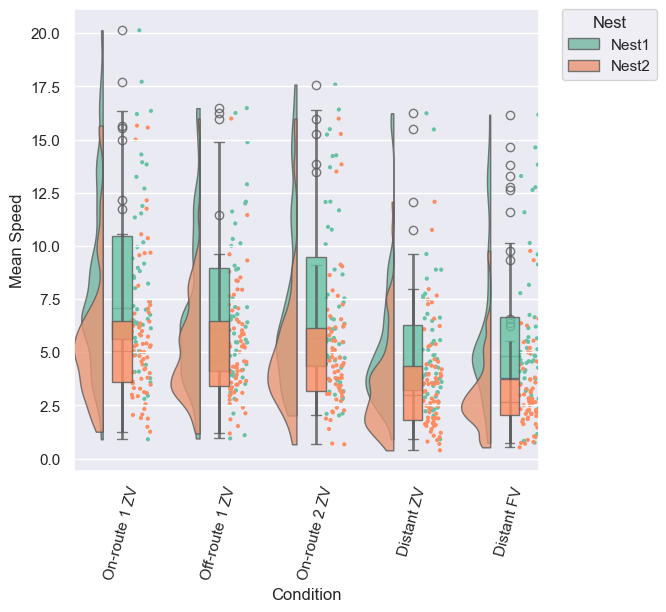

In [43]:


sns.set(font_scale=1)



x_var = 'Condition'

hue_var = 'Nest'
colsplit = 'Nest'


ax = pt.RainCloud(
    x= x_var, y=y_var, hue = hue_var, data = both_all, palette = "Set2",
    width_viol=0.6, width_box = 0.2,
    move = 0.2, orient="v", alpha= 0.8 )

ax.set_xlabel('Condition')
ax.tick_params(axis='x', rotation=75)
ax.set_ylabel('Mean Speed')
plt.show()

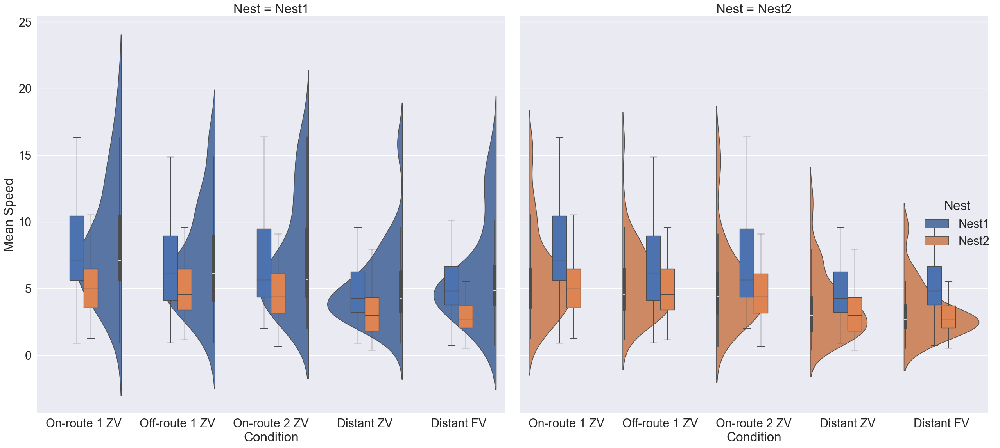

In [44]:

sns.set(font_scale=2)

x_var = 'Condition'

colsplit = 'Nest'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit,
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit )#


for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)

    ax.set_xlabel('Condition')
    ax.set_ylabel('Mean Speed')
plt.tight_layout()
plt.show()

## straightness idx

/tmp/ipykernel_121840/4131639210.py:13: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/4131639210.py:13: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


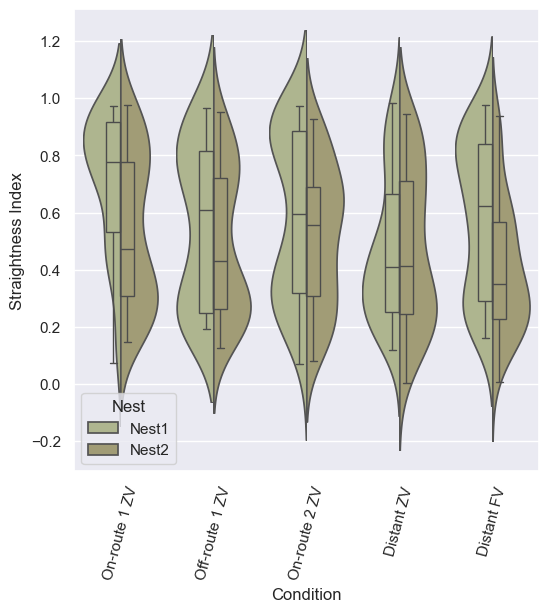

In [45]:
# TrimLengthTotalmm



x_var = 'Condition'
y_var = 'TrimStraightnessIndex'

df = both_all


sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_xlabel('Condition')
ax.set_ylabel('Straightness Index')

plt.show()
plt.show()

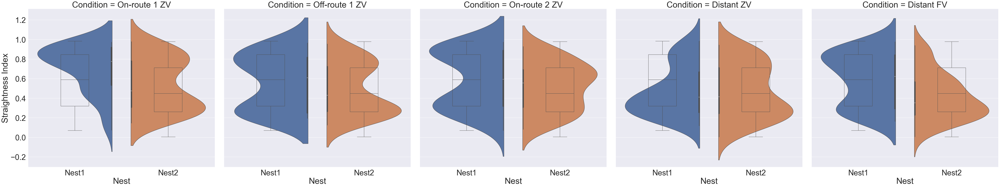

In [46]:
x_var = 'Nest'

sns.set(font_scale=3)
g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue='Nest', legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():
    
    ax.set_xlabel('Nest')
    ax.set_ylabel('Straightness Index')

plt.tight_layout()
plt.show()

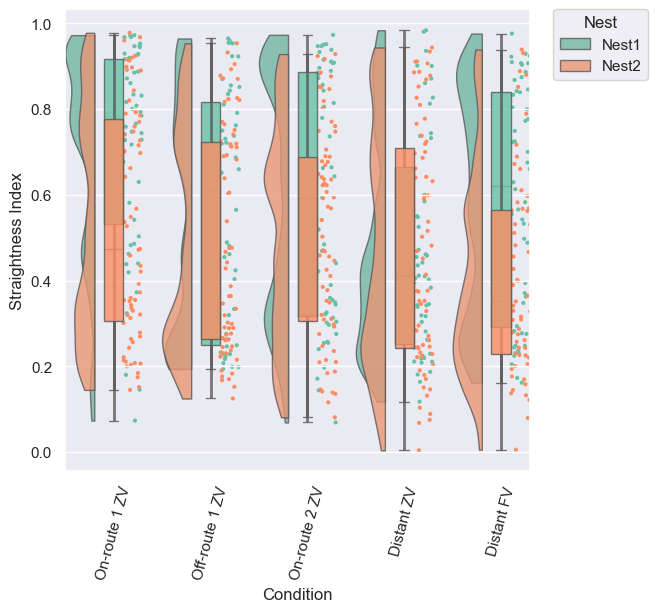

In [47]:


sns.set(font_scale=1)



x_var = 'Condition'

hue_var = 'Nest'
colsplit = 'Nest'


ax = pt.RainCloud(
    x= x_var, y=y_var, hue = hue_var, data = both_all, palette = "Set2",
    width_viol=0.6, width_box = 0.2,
    move = 0.2, orient="v", alpha= 0.8 )

ax.set_xlabel('Condition')
ax.tick_params(axis='x', rotation=75)
ax.set_ylabel('Straightness Index')
plt.show()

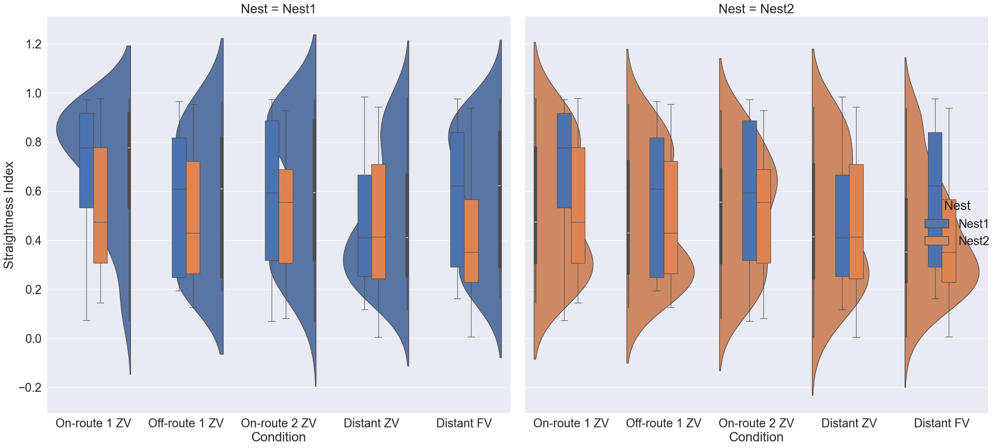

In [48]:

sns.set(font_scale=2)

x_var = 'Condition'

colsplit = 'Nest'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit,
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit )#


for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)

    ax.set_xlabel('Condition')
    ax.set_ylabel('Straightness Index')
plt.tight_layout()
plt.show()

## strightness Circ_r Trim NG

In [49]:
x_var = 'Condition'
y_var = 'TrimStraightnessIndex'
y_title = 'Trim NG     Circ_r'
df = both_all

/tmp/ipykernel_121840/1976937046.py:3: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/1976937046.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


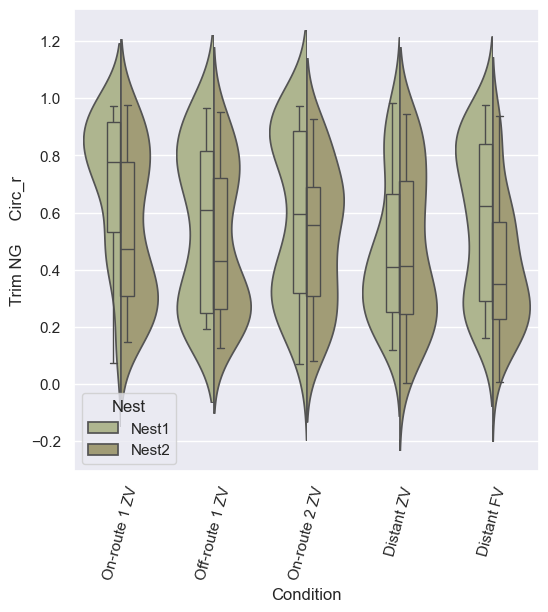

In [50]:

sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_xlabel('Condition')
ax.set_ylabel(y_title)

plt.show()
plt.show()

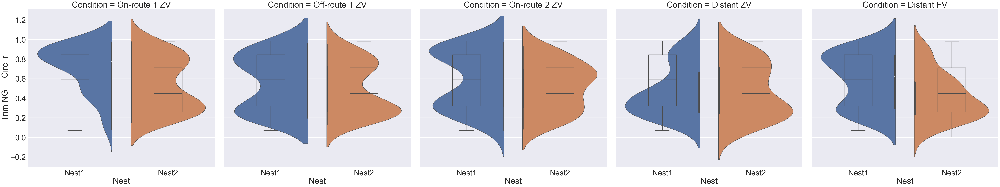

In [51]:
x_var = 'Nest'

sns.set(font_scale=3)
g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue='Nest', legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():
    
    ax.set_xlabel('Nest')
    ax.set_ylabel(y_title)

plt.tight_layout()
plt.show()

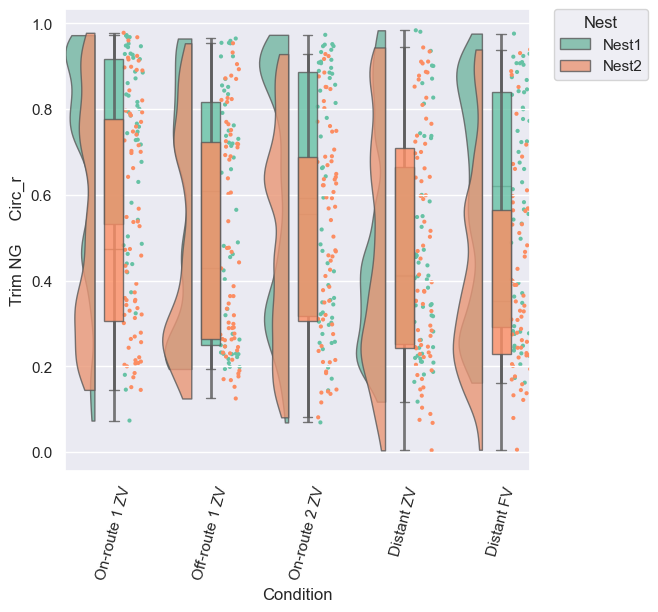

In [52]:


sns.set(font_scale=1)



x_var = 'Condition'

hue_var = 'Nest'
colsplit = 'Nest'


ax = pt.RainCloud(
    x= x_var, y=y_var, hue = hue_var, data = both_all, palette = "Set2",
    width_viol=0.6, width_box = 0.2,
    move = 0.2, orient="v", alpha= 0.8 )

ax.set_xlabel('Condition')
ax.tick_params(axis='x', rotation=75)
ax.set_ylabel(y_title)
plt.show()

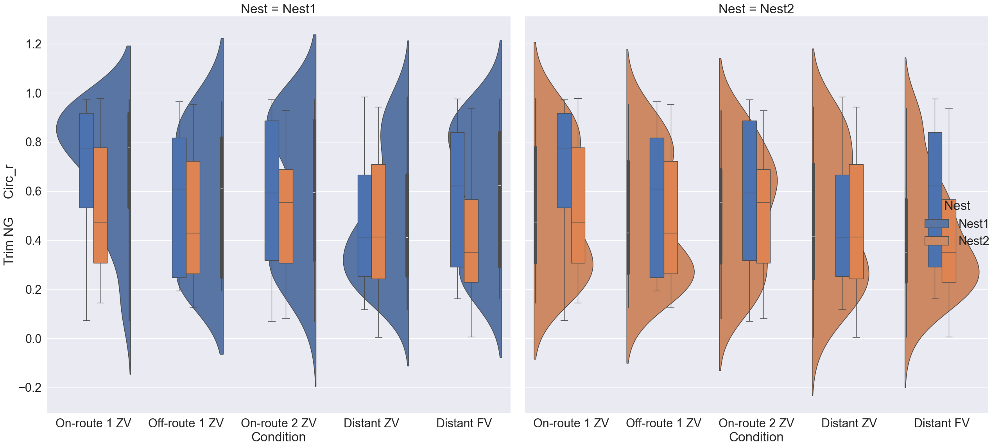

In [53]:

sns.set(font_scale=2)

x_var = 'Condition'

colsplit = 'Nest'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit,
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit )#


for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)

    ax.set_xlabel('Condition')
    ax.set_ylabel(y_title)
plt.tight_layout()
plt.show()

## Circ_r chunked

In [54]:
x_var = 'Condition'
y_var = 'TrimChunksCircR'
y_title = 'Chunked Path     Circ_r'
df = both_all

/tmp/ipykernel_121840/1976937046.py:3: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/1976937046.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


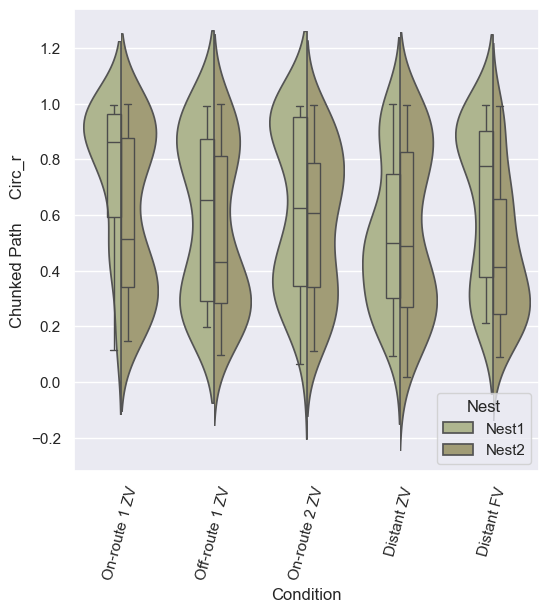

In [55]:

sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

ax.set_xlabel('Condition')
ax.set_ylabel(y_title)

plt.show()
plt.show()

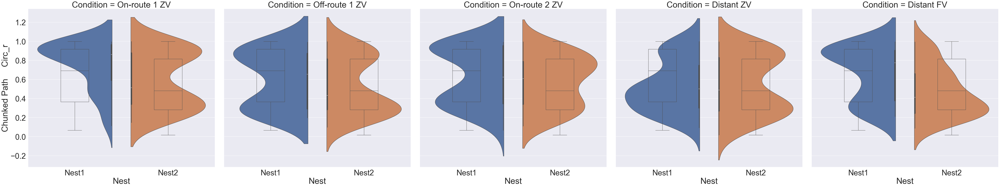

In [56]:
x_var = 'Nest'

sns.set(font_scale=3)
g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue='Nest', legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():
    
    ax.set_xlabel('Nest')
    ax.set_ylabel(y_title)

plt.tight_layout()
plt.show()

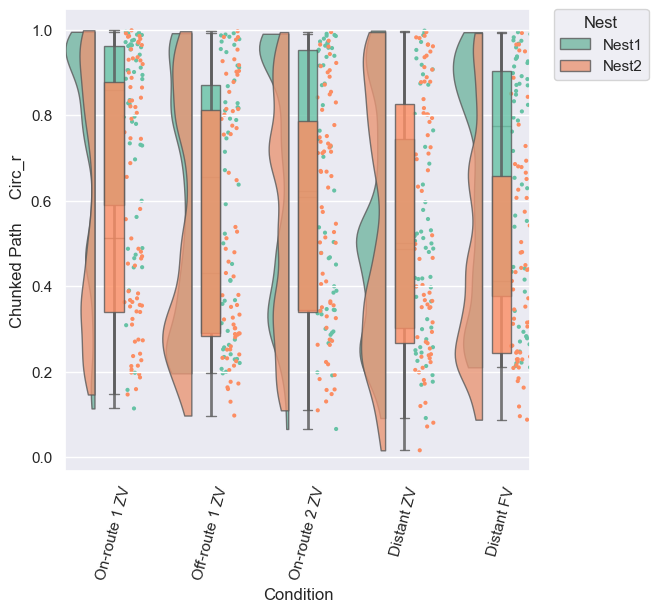

In [57]:


sns.set(font_scale=1)



x_var = 'Condition'

hue_var = 'Nest'
colsplit = 'Nest'


ax = pt.RainCloud(
    x= x_var, y=y_var, hue = hue_var, data = both_all, palette = "Set2",
    width_viol=0.6, width_box = 0.2,
    move = 0.2, orient="v", alpha= 0.8 )

ax.set_xlabel('Condition')
ax.tick_params(axis='x', rotation=75)
ax.set_ylabel(y_title)
plt.show()

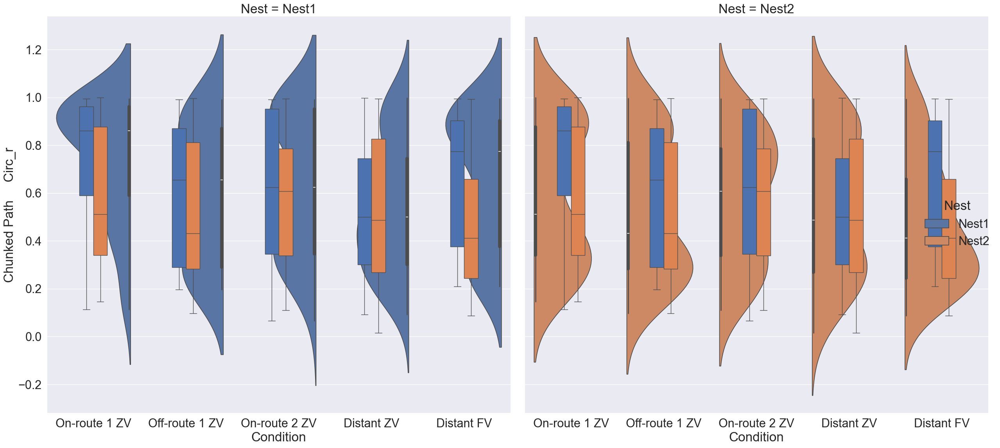

In [58]:

sns.set(font_scale=2)

x_var = 'Condition'

colsplit = 'Nest'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit,
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit )#


for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)

    ax.set_xlabel('Condition')
    ax.set_ylabel(y_title)
plt.tight_layout()
plt.show()

## final heading

In [59]:
x_var = 'Condition'
y_var = 'TrimFinalPointRelToNest'
y_title = 'Heading Direction (relative to nest)'
df = both_all

/tmp/ipykernel_121840/3259824767.py:3: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/3259824767.py:3: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


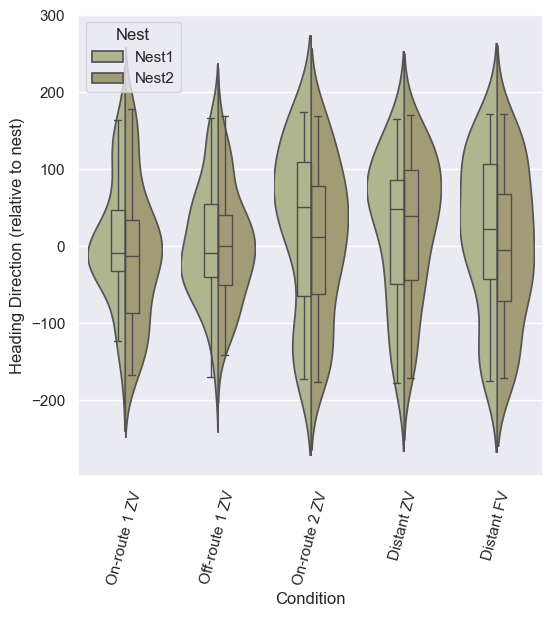

In [60]:

sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

#ax.set_xlabel('Condition')
ax.set_ylabel(y_title)

plt.show()
plt.show()

NewN_ONR
WigNew_ONR
NewN_ONROFR
distant_only

In [144]:
np.unique(both_ONR['Condition'])
print(list(both_ONR))
#both_ONR = both_ONR.drop('Unnamed: 0', axis=1)
print(list(both_ONR))
print(both_ONR.head)

['Nest', 'Condition', 'Ant ID', 'TrimStraightnessIndex', 'TrimNoGaps_CircR', 'TrimChunksCircR', 'TrimSpeedPerFrameNoGapsMean', 'TrimFinalPointRelToNest', 'TrimLengthTotalmm', 'TrimBeelinePath (mm)']
['Nest', 'Condition', 'Ant ID', 'TrimStraightnessIndex', 'TrimNoGaps_CircR', 'TrimChunksCircR', 'TrimSpeedPerFrameNoGapsMean', 'TrimFinalPointRelToNest', 'TrimLengthTotalmm', 'TrimBeelinePath (mm)']
<bound method NDFrame.head of         Nest      Condition  Ant ID  TrimStraightnessIndex  TrimNoGaps_CircR  \
0    NewNest  On-route 1 ZV   552.0               0.208045          0.117999   
1    NewNest  On-route 1 ZV   553.0               0.715739          0.493537   
2    NewNest  On-route 1 ZV   554.0               0.354644          0.111001   
3    NewNest  On-route 1 ZV   556.0               0.527030          0.368590   
4    NewNest  On-route 1 ZV   557.0               0.330020          0.183265   
..       ...            ...     ...                    ...               ...   
250  NewNest

/tmp/ipykernel_121840/291638353.py:4: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/291638353.py:4: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


ValueError: cannot reindex on an axis with duplicate labels

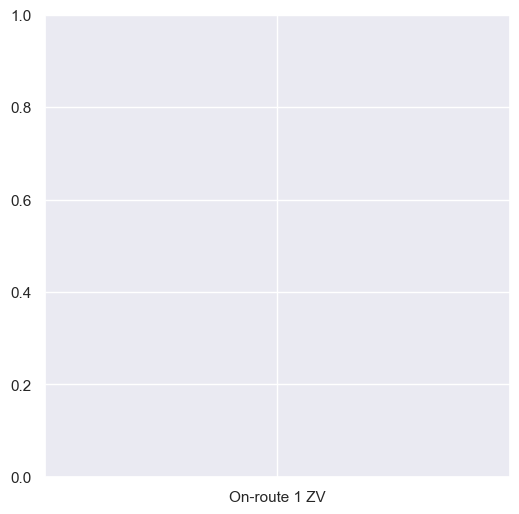

In [145]:
df = both_ONR
sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

#ax.set_xlabel('Condition')
ax.set_ylabel(y_title)

plt.show()
plt.show()

/tmp/ipykernel_121840/2266545535.py:4: UserWarning: The palette list has more values (6) than needed (1), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/2266545535.py:4: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


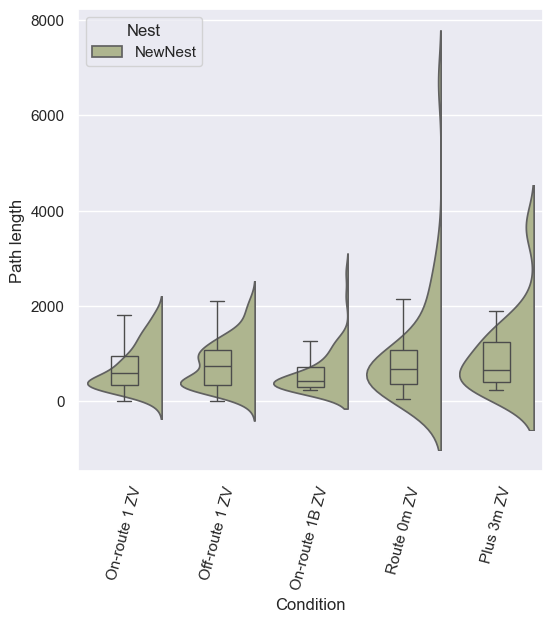

In [131]:
df = NewN_ONROFR
sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

#ax.set_xlabel('Condition')
ax.set_ylabel(y_title)

plt.show()
plt.show()

/tmp/ipykernel_121840/3560028680.py:4: UserWarning: The palette list has more values (6) than needed (2), which may not be intended.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')
/tmp/ipykernel_121840/3560028680.py:4: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


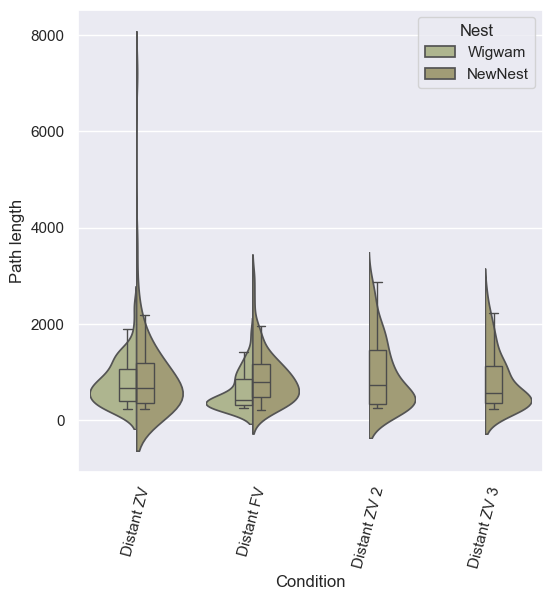

In [132]:
df = distant_only
sns.set(font_scale=1)

ax = sns.violinplot(y=y_var, x=x_var, data=df, palette=palette, scale='width', inner=None, split=True, hue='Nest')


xlim= ax.get_xlim()
ylim = ax.get_ylim()

for violin in ax.collections:
    bbox=violin.get_paths()[0].get_extents()
    x0, y0, width, height = bbox.bounds
    violin.set_clip_path(plt.Rectangle((x0, y0), width, height, transform=ax.transData)) # height /2

sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
old_len_collections = len(ax.collections)

ax.tick_params(axis='x', rotation=75) #, size=25


ax.set_xlim(xlim)
ax.set_ylim(ylim)

#ax.set_xlabel('Condition')
ax.set_ylabel(y_title)

plt.show()
plt.show()

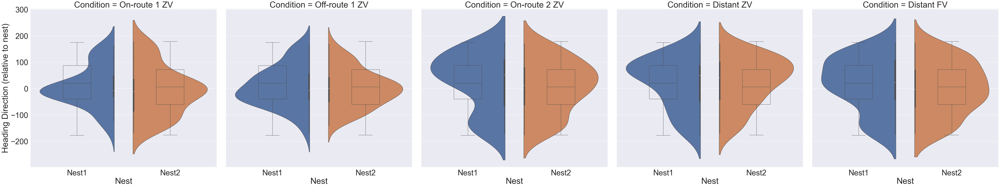

In [61]:
x_var = 'Nest'

sns.set(font_scale=3)
g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = 'Condition', #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    errorbar="sd", height=12, margin_titles=True, split=True, hue='Nest', legend=False )# palette="colorblind",
#) #, legend=True

for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, boxprops={'zorder':3, 'facecolor':'none'}, ax=ax, hue='Nest', legend=False)
#old_len_collections = len(ax.collections)
#for ax in g.axes_dict.values():
    
    ax.set_xlabel('Nest')
    ax.set_ylabel(y_title)

plt.tight_layout()
plt.show()

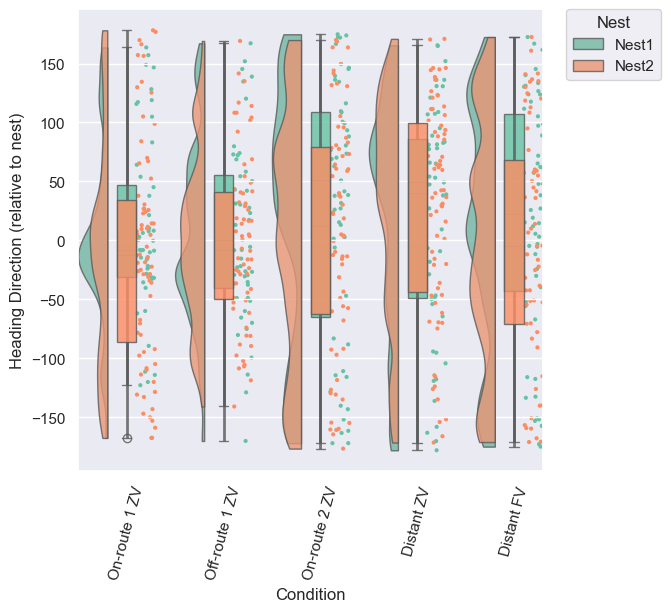

In [62]:


sns.set(font_scale=1)



x_var = 'Condition'

hue_var = 'Nest'
colsplit = 'Nest'


ax = pt.RainCloud(
    x= x_var, y=y_var, hue = hue_var, data = both_all, palette = "Set2",
    width_viol=0.6, width_box = 0.2,
    move = 0.2, orient="v", alpha= 0.8 )

ax.set_xlabel('Condition')
ax.tick_params(axis='x', rotation=75)
ax.set_ylabel(y_title)
plt.show()

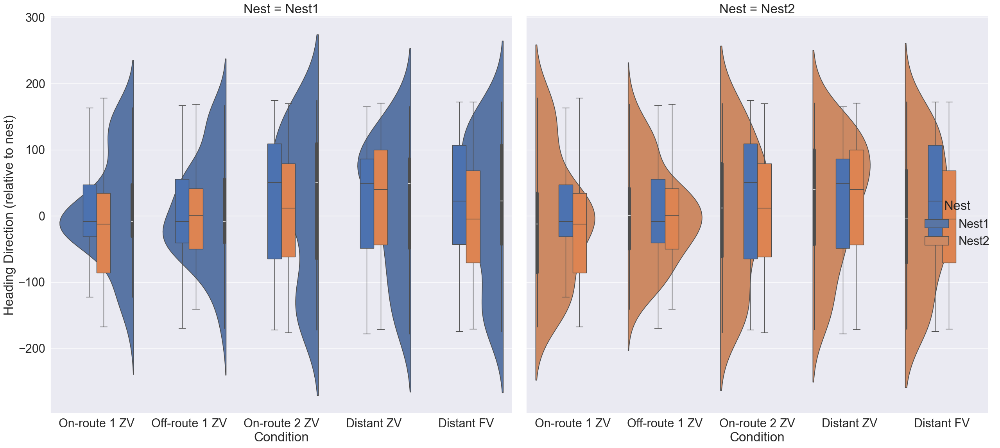

In [63]:

sns.set(font_scale=2)

x_var = 'Condition'

colsplit = 'Nest'

g = sns.catplot(
    data= both_all, kind= "violin",
    x=x_var,  y=y_var, col = colsplit,
    errorbar="sd", height=12, margin_titles=True, split=True, hue= colsplit )#


for ax in g.axes.flat:
    sns.boxplot(y=y_var, x = x_var, data=df, saturation=1, showfliers=False, width=0.3, ax=ax, hue='Nest', legend=False)

    ax.set_xlabel('Condition')
    ax.set_ylabel(y_title)
plt.tight_layout()
plt.show()

## are vars affected by distance trvelled? distance from nest?

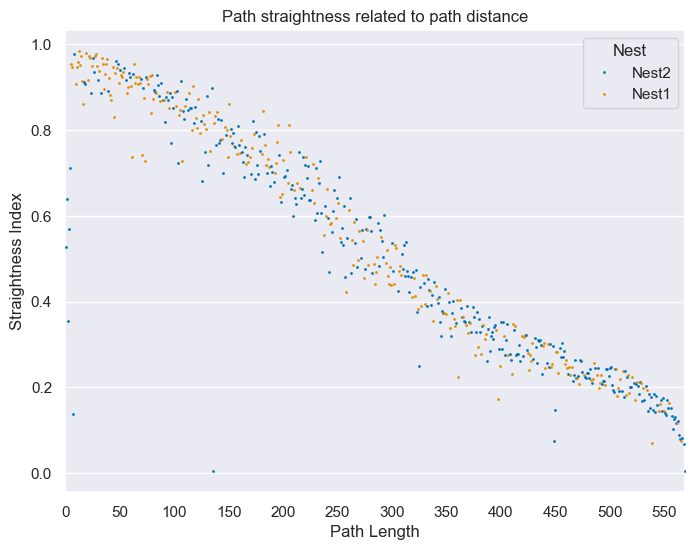

In [64]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimStraightnessIndex'
df = both_all

sns.set(font_scale=1)

fig, ax = plt.subplots(figsize=(8, 6))

sns.stripplot(y=y_var, x=x_var, data=both_all, palette='colorblind', size=2, hue='Nest', ax=ax) # color ='dodgerblue'


ax.xaxis.set_major_locator(ticker.MultipleLocator(50))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x)}'))

#ax.tick_params(axis='x', rotation=75)
plt.title("Path straightness related to path distance")

ax.set_xlabel('Path Length')
ax.set_ylabel("Straightness Index")
plt.show()

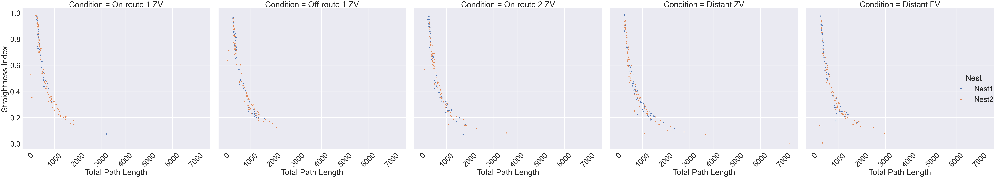

In [93]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimStraightnessIndex'
df = both_all

y_title = "Straightness Index"
x_title =  "Total Path Length"

sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

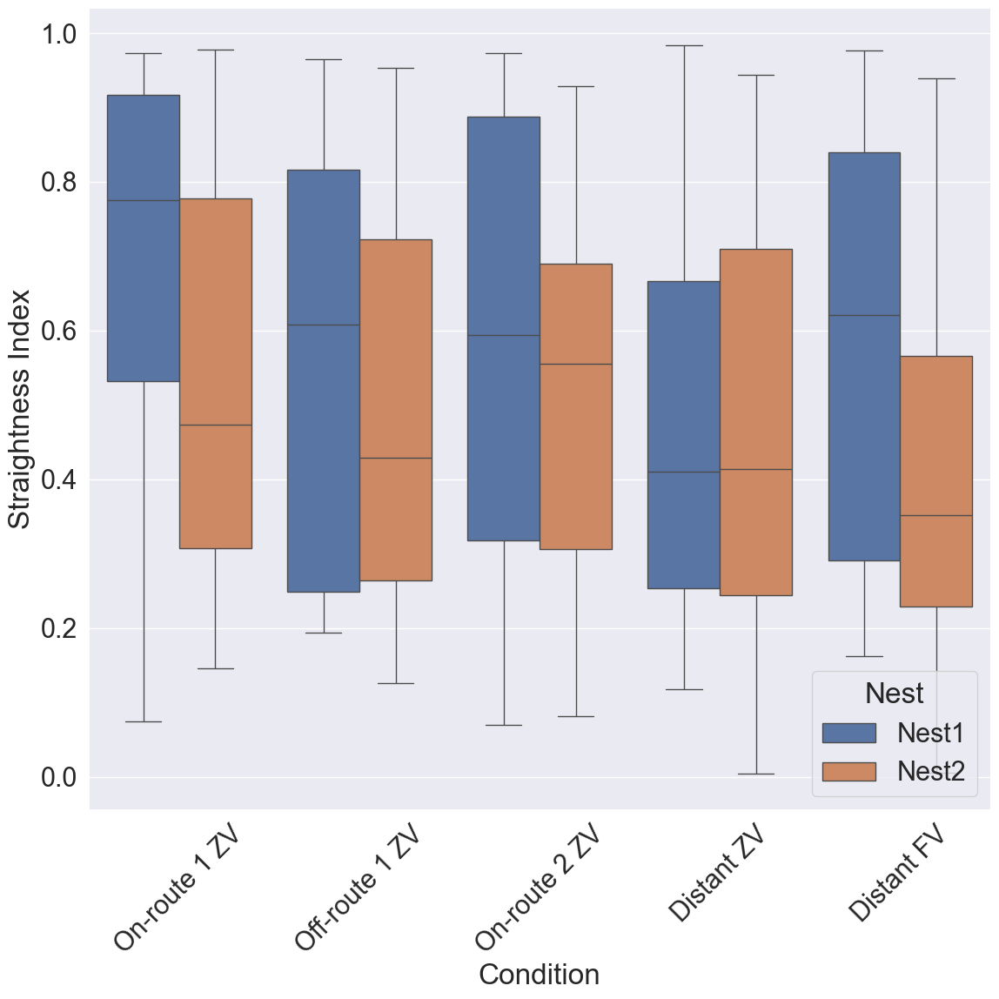

In [119]:
x_var = 'Condition'
y_var = 'TrimStraightnessIndex'
df = both_all

y_title = "Straightness Index"
x_title =  "Condition"

sns.set(font_scale=2)
g = sns.catplot(
    data= both_all,
    x=x_var,  y=y_var,kind='box',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True, legend_out=False)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

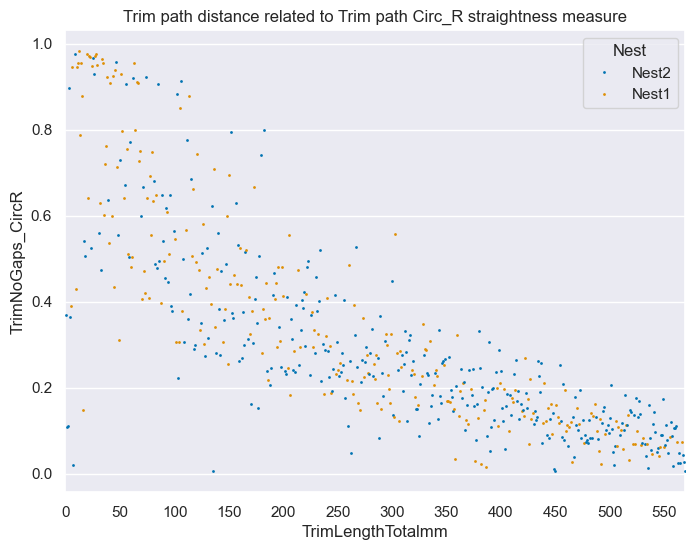

In [65]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimNoGaps_CircR'
df = both_all

fig, ax = plt.subplots(figsize=(8, 6))


sns.stripplot(y=y_var, x=x_var, data=both_all, palette='colorblind', size=2, hue='Nest', ax=ax)

ax.xaxis.set_major_locator(ticker.MultipleLocator(50))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x)}'))

plt.title("Trim path distance related to Trim path Circ_R straightness measure")

plt.show()

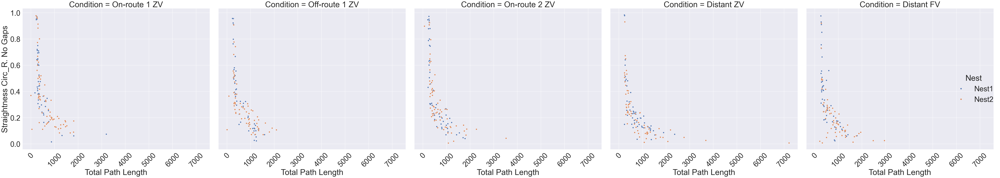

In [97]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimNoGaps_CircR'
df = both_all

y_title = "Straightness Circ_R. No Gaps"
x_title =  "Total Path Length"

sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

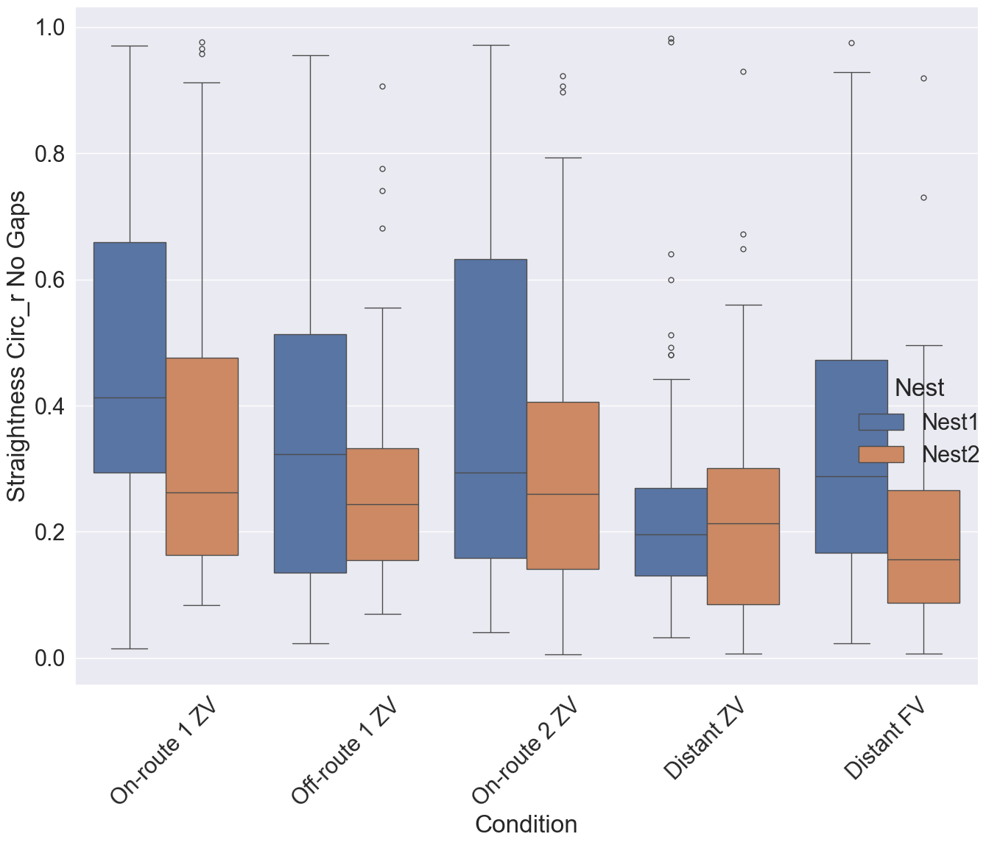

In [123]:
x_var = 'Condition'
y_var = 'TrimNoGaps_CircR'
df = both_all

y_title = "Straightness Circ_r No Gaps"
x_title =  "Condition"

sns.set(font_scale=2)
g = sns.catplot(
    data= both_all,
    x=x_var,  y=y_var,kind='box',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True, legend_out=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

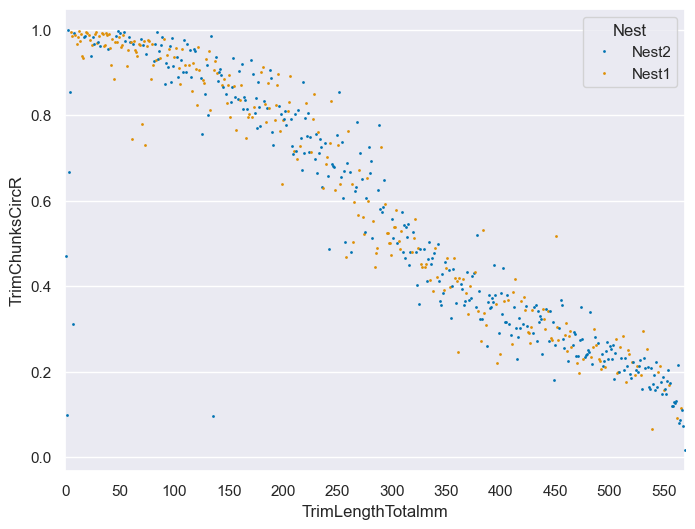

In [66]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimChunksCircR'
df = both_all

fig, ax = plt.subplots(figsize=(8, 6))


sns.stripplot(y=y_var, x=x_var, data=both_all, palette='colorblind', size=2, hue='Nest', ax=ax)

ax.xaxis.set_major_locator(ticker.MultipleLocator(50))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x)}'))

plt.show()

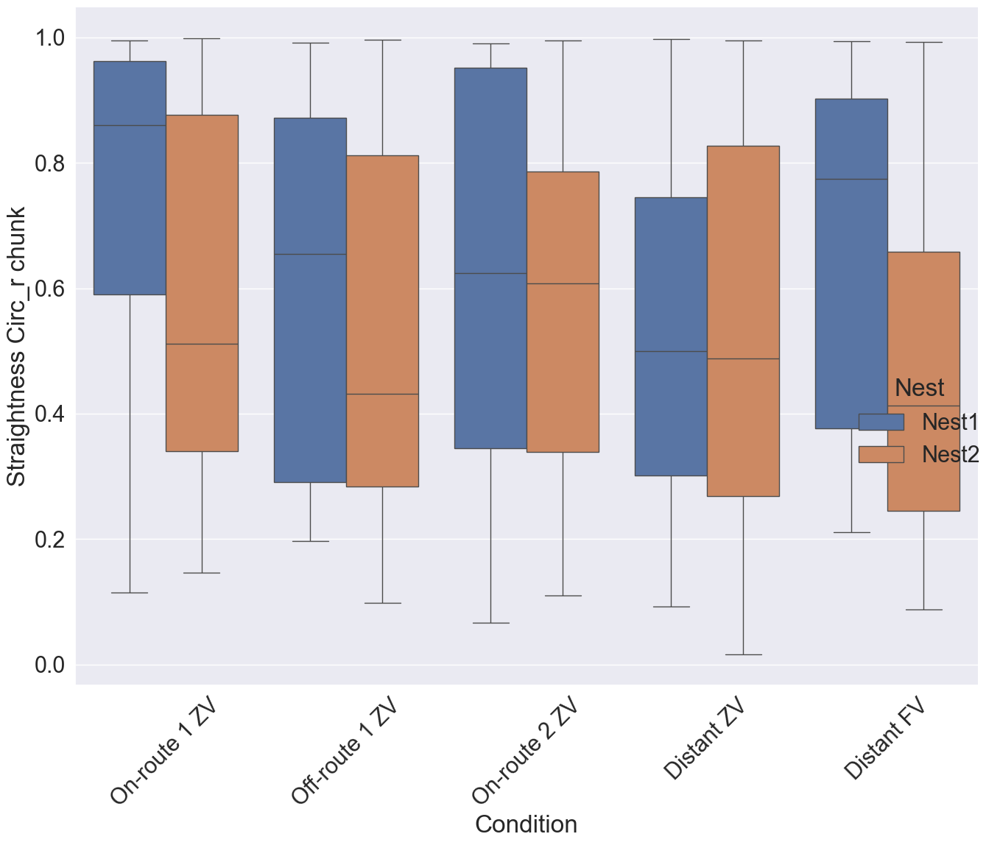

In [122]:
x_var = 'Condition'
y_var = 'TrimChunksCircR'
df = both_all

y_title = "Straightness Circ_r chunk"
x_title =  "Condition"

sns.set(font_scale=2)
g = sns.catplot(
    data= both_all,
    x=x_var,  y=y_var,kind='box',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True, legend_out=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

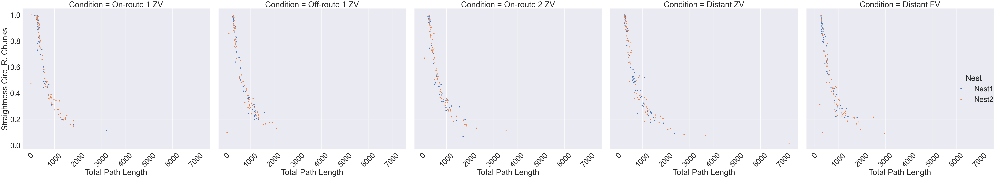

In [98]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimChunksCircR'
df = both_all

y_title = "Straightness Circ_R. Chunks"
x_title =  "Total Path Length"

sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

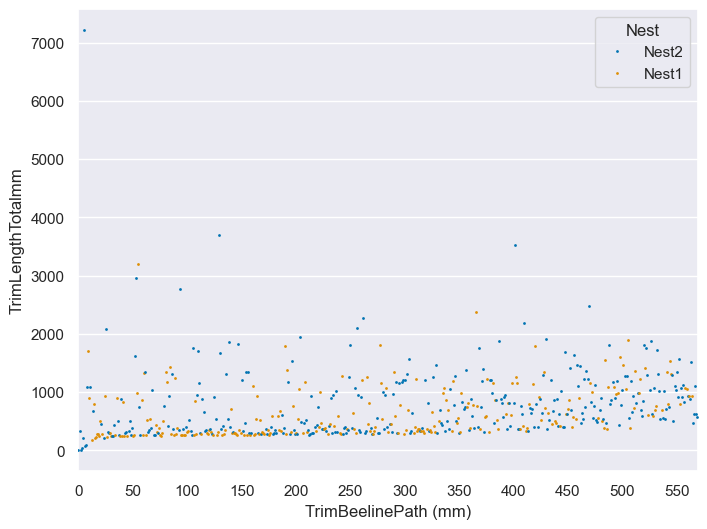

In [67]:
x_var = 'TrimBeelinePath (mm)'
y_var = 'TrimLengthTotalmm'
df = both_all

fig, ax = plt.subplots(figsize=(8, 6))

sns.stripplot(y=y_var, x=x_var, data=both_all, palette='colorblind', size=2, hue='Nest', ax=ax)

ax.xaxis.set_major_locator(ticker.MultipleLocator(50))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x)}'))


plt.show()

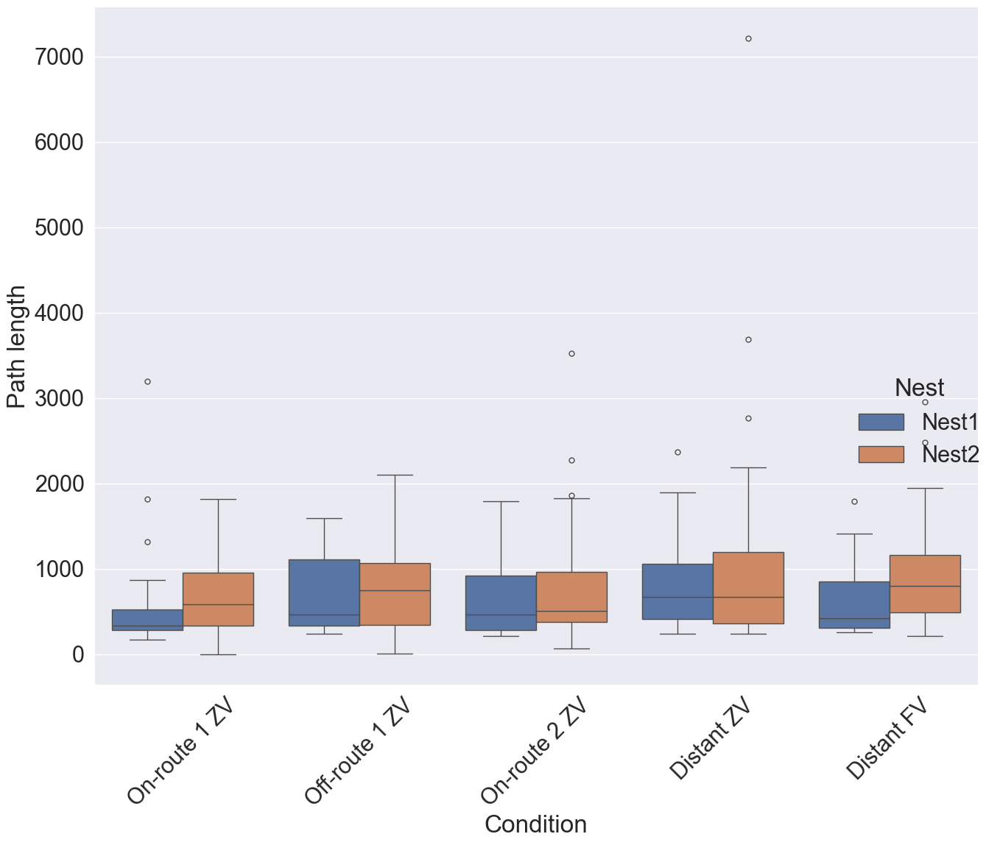

In [124]:
x_var = 'Condition'
y_var = 'TrimLengthTotalmm'
df = both_all

y_title = "Path length"
x_title =  "Condition"

sns.set(font_scale=2)
g = sns.catplot(
    data= both_all,
    x=x_var,  y=y_var,kind='box',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True, legend_out=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

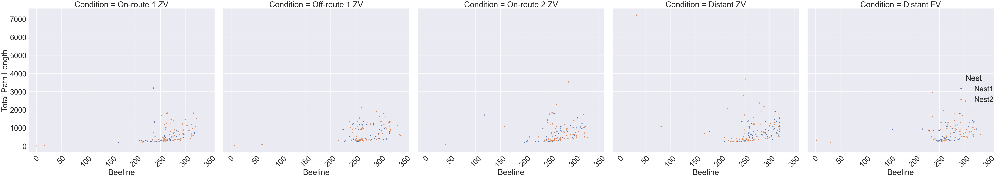

In [99]:
x_var = 'TrimBeelinePath (mm)'
y_var = 'TrimLengthTotalmm'
df = both_all

x_title =  "Beeline"
y_title = "Total Path Length"


sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    ax.tick_params(axis='x', rotation=45)
    ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

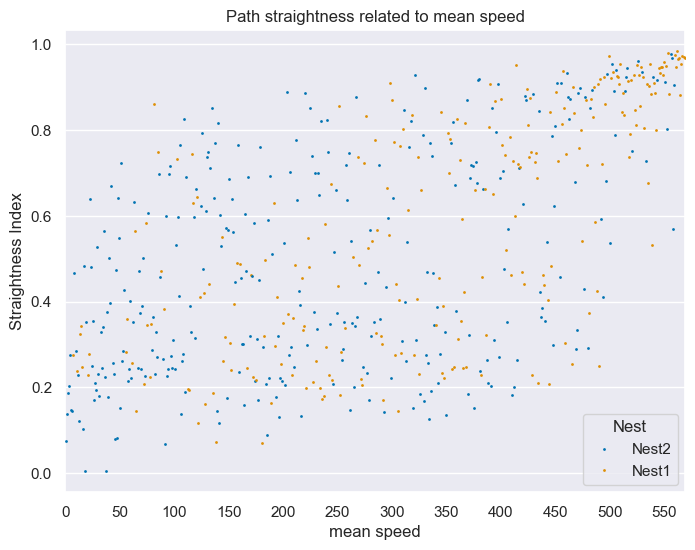

In [68]:
x_var = 'TrimSpeedPerFrameNoGapsMean'
y_var = 'TrimStraightnessIndex'
df = both_all

sns.set(font_scale=1)

fig, ax = plt.subplots(figsize=(8, 6))

sns.stripplot(y=y_var, x=x_var, data=both_all, palette='colorblind', size=2, hue='Nest', ax=ax) # color ='dodgerblue'


ax.xaxis.set_major_locator(ticker.MultipleLocator(50))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x)}'))

#ax.tick_params(axis='x', rotation=75)
plt.title("Path straightness related to mean speed")

ax.set_xlabel('mean speed')
ax.set_ylabel("Straightness Index")
plt.show()

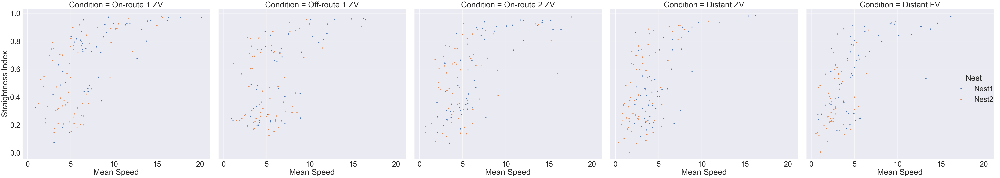

In [101]:
x_var = 'TrimSpeedPerFrameNoGapsMean'
y_var = 'TrimStraightnessIndex'
df = both_all


x_title =  "Mean Speed"
y_title = "Straightness Index"


sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    #ax.tick_params(axis='x', rotation=45)
    #ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

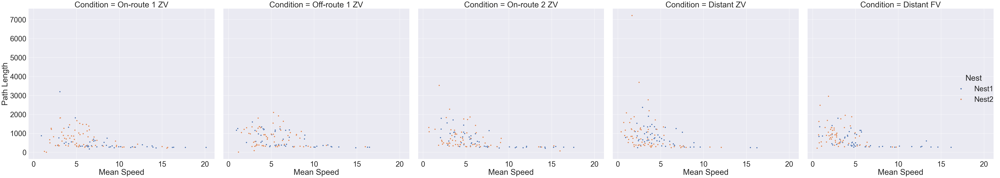

In [104]:
x_var = 'TrimSpeedPerFrameNoGapsMean'
y_var = 'TrimLengthTotalmm'
df = both_all


x_title =  "Mean Speed"
y_title = "Path Length"


sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    #ax.tick_params(axis='x', rotation=45)
    #ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

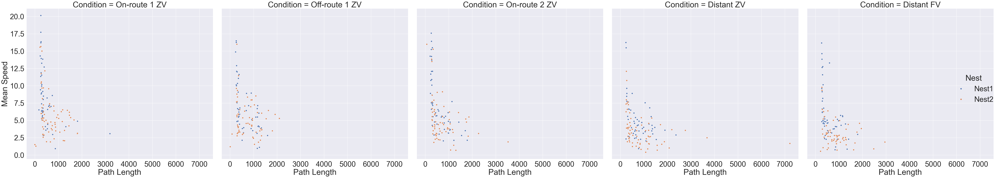

In [107]:
x_var = 'TrimLengthTotalmm'
y_var = 'TrimSpeedPerFrameNoGapsMean'
df = both_all


x_title =  "Path Length"
y_title = "Mean Speed"


sns.set(font_scale=3)
g = sns.relplot(
    data= both_all,
    x=x_var,  y=y_var, col = 'Condition',  #hue = 'TrimNoGaps_CircR', #row='lr',col='resolution', 
    height=12, hue='Nest', legend=True)# palette="colorblind",
#) #, legend=True
for ax in g.axes.flat:
    #ax.tick_params(axis='x', rotation=45)
    #ticks = ax.get_xticks()
    #if len(ticks) > 10:  # limit to ~10 labels
    #    ax.set_xticks(np.linspace(min(ticks), max(ticks), 10).astype(int))
    ax.set_xlabel(x_title)
    ax.set_ylabel(y_title)



plt.tight_layout()
plt.show()

# Speed & Straightness relating to Distance Travelled, Time, Dist from nest (rename conditions by their distance)

In [69]:
print(list(both_all))
print()
print(list(Trim_all))
    

['Nest', 'Condition', 'Ant ID', 'TrimStraightnessIndex', 'TrimNoGaps_CircR', 'TrimChunksCircR', 'TrimSpeedPerFrameNoGapsMean', 'TrimFinalPointRelToNest', 'TrimLengthTotalmm', 'TrimBeelinePath (mm)']

['Unnamed: 0.1', 'index', 'Unnamed: 0', 'Date', 'ID', 'frame', 'x', 'y', 'Nest', 'Condition', 'Sector', 'Direction', 'DI', 'rad', 'theta', 'dTheta', 'thetaR2N', 'deltaDist', 'accumDist', 'speed', 'time', 'meanSpeed', 'dx', 'dy', 'trim_StraightnessIDX', 'trim_beeline', 'trim_circR']


fig, i, j,numrows, numcols, df_coordinates, condition, nest, title:str, pindex='frame', save =False, xname='x', yname='y', bkgrnd=None, step =10, foodcentered =False, save_path='/its/home/nn268/antvis/antvis/optics/Captains_Log/Exp2_AntTracks/abbotsplots/multipath/'

df, conditions:list, w_space = -0.45, h_space=-0.01